In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as g
from tqdm.notebook import tqdm
import gc

In [2]:
import warnings
warnings.filterwarnings(action='ignore')

In [3]:
pd.options.display.max_columns = None
# pd.options.display.max_rows = None

In [4]:
def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2    
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

## ♜ V컬럼 수정 처리

In [9]:
train_t = pd.read_csv('data/train_transaction.csv')
train_i = pd.read_csv('data/train_identity.csv')
test_t = pd.read_csv('data/test_transaction.csv')
test_i = pd.read_csv('data/test_identity.csv')

train_t = reduce_mem_usage(train_t)
train_i = reduce_mem_usage(train_i)
test_t = reduce_mem_usage(test_t)
test_i = reduce_mem_usage(test_i)

train_t['target'] = 'train'
test_t['target'] = 'test'

# col_t = [ col for col in list(train_t.columns) if 'V' != col[0] ][1:]
# col_v = col_t[1:]
# len(col_v)

# train_t = train_t[col_t]
# test_t = test_t[col_v]

# total_t = pd.concat([train_t,test_t])
df = train_t.merge(train_i, on ='TransactionID', how='left')
del train_t, train_i;

Mem. usage decreased to 542.35 Mb (69.4% reduction)
Mem. usage decreased to 25.86 Mb (42.7% reduction)
Mem. usage decreased to 472.59 Mb (68.9% reduction)
Mem. usage decreased to 25.44 Mb (42.7% reduction)


In [10]:
df.shape

(590540, 435)

### - V 컬럼 수정

In [16]:
v =  [1, 3, 4, 6, 8, 11]
v += [13, 14, 17, 20, 23, 26, 27, 30]
v += [36, 37, 40, 41, 44, 47, 48]
v += [54, 56, 59, 62, 65, 67, 68, 70]
v += [76, 78, 80, 82, 86, 88, 89, 91]
v += [96, 98, 99, 104]
v += [107, 108, 111, 115, 117, 120, 121, 123]
v += [124, 127, 129, 130, 136]
v += [138, 139, 142, 147, 156, 162]
v += [165, 160, 166]
v += [178, 176, 173, 182]
v += [187, 203, 205, 207, 215]
v += [169, 171, 175, 180, 185, 188, 198, 210, 209]
v += [218, 223, 224, 226, 228, 229, 235]
v += [240, 258, 257, 253, 252, 260, 261]
v += [264, 266, 267, 274, 277]
v += [220, 221, 234, 238, 250, 271]
v += [294, 284, 285, 286, 291, 297]
v += [303, 305, 307, 309, 310, 320]
v += [281, 283, 289, 296, 301, 314]
v += [332, 325, 335, 338]

In [18]:
len(v)

128

In [23]:
cols = df.columns
cols

Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt',
       'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5',
       ...
       'id_31', 'id_32', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38',
       'DeviceType', 'DeviceInfo'],
      dtype='object', length=435)

In [ ]:
vcols = [c for c in cols if c[0] == 'V']
dfv = df[vcols]

In [29]:
df =df.drop(columns=vcols)

In [39]:
vv = ['V'+str(n) for n in v]

In [51]:
dfv = dfv[vv]

In [55]:
df = pd.concat([df,dfv], axis=1)

In [57]:
df.to_csv('merge.csv')

## ♜ 데이터 로드 & 전처리

In [9]:
df = pd.read_csv('merge.csv').drop(['Unnamed: 0','target'],axis=1)

In [10]:
df.describe()

,TransactionID,isFraud,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_13,id_14,id_17,id_18,id_19,id_20,id_21,id_22,id_24,id_25,id_26,id_32,V1,V3,V4,V6,V8,V11,V13,V14,V17,V20,V23,V26,V27,V30,V36,V37,V40,V41,V44,V47,V48,V54,V56,V59,V62,V65,V67,V68,V70,V76,V78,V80,V82,V86,V88,V89,V91,V96,V98,V99,V104,V107,V108,V111,V115,V117,V120,V121,V123,V124,V127,V129,V130,V136,V138,V139,V142,V147,V156,V162,V165,V160,V166,V178,V176,V173,V182,V187,V203,V205,V207,V215,V169,V171,V175,V180,V185,V188,V198,V210,V209,V218,V223,V224,V226,V228,V229,V235,V240,V258,V257,V253,V252,V260,V261,V264,V266,V267,V274,V277,V220,V221,V234,V238,V250,V271,V294,V284,V285,V286,V291,V297,V303,V305,V307,V309,V310,V320,V281,V283,V289,V296,V301,V314,V332,V325,V335,V338
count,5.905400e+05,590540.000000,5.905400e+05,590540.000000,590540.000000,581607.000000,588975.000000,586281.000000,524834.000000,524834.000000,238269.000000,37627.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,589271.000000,309743.000000,327662.000000,421618.000000,280699.000000,73187.000000,38917.000000,74926.000000,74926.000000,514518.000000,311253.000000,64717.000000,61952.000000,62187.000000,501427.000000,144233.000000,140872.000000,66324.000000,66324.000000,136865.000000,136865.000000,5155.000000,5155.000000,74926.000000,74926.000000,140978.000000,127320.000000,80044.000000,139369.000000,45113.000000,139318.000000,139261.000000,5159.000000,5169.000000,4747.000000,5132.000000,5163.000000,77586.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,421571.000000,421571.000000,421571.000000,421571.000000,421571.000000,421571.000000,421571.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,590226.00000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,81945.000000,81945.000000,81945.000000,81945.000000,81945.000000,81945.000000,81951.000000,81951.000000,81951.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.00000,139819.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,141416.000000,141416.000000,141416.000000,141416.000000,141416.000000,141416.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,589271.000000,589271.000000,589271.000000,589271.000000,589271.000000,589271.000000,82351.000000,82351.000000,82351.000000,82351.000000
mean,3.282270e+06,0.034990,7.372311e+06,135.027682,9898.734658,362.555488,153.194925,199.278897,290.733794,86.800630,118.502344,231.856273,14.092392,15.269836,0.005644,4.092183,5.571526,9.071081,2.848476,5.144554,4.480240,5.240344,10.241547,4.076252,32.539916,8.295215,94.347568,169.563231,28.343348,140.002441,42.335965,69.805717,41.638950,146.062246,0.561057,123.982137,146.621465,54.037533,17.901295,57.724444,163.7445

In [11]:
df.columns[:95]

Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt',
       'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6',
       'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain',
       'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11',
       'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8',
       'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4',
       'M5', 'M6', 'M7', 'M8', 'M9', 'id_01', 'id_02', 'id_03', 'id_04',
       'id_05', 'id_06', 'id_07', 'id_08', 'id_09', 'id_10', 'id_11', 'id_12',
       'id_13', 'id_14', 'id_15', 'id_16', 'id_17', 'id_18', 'id_19', 'id_20',
       'id_21', 'id_22', 'id_23', 'id_24', 'id_25', 'id_26', 'id_27', 'id_28',
       'id_29', 'id_30', 'id_31', 'id_32', 'id_33', 'id_34', 'id_35', 'id_36',
       'id_37', 'id_38', 'DeviceType', 'DeviceInfo'],
      dtype='object')

In [8]:
df['id_02'].describe()

count    140872.000000
mean     174716.584708
std      159651.816856
min           1.000000
25%       67992.000000
50%      125800.500000
75%      228749.000000
max      999595.000000
Name: id_02, dtype: float64

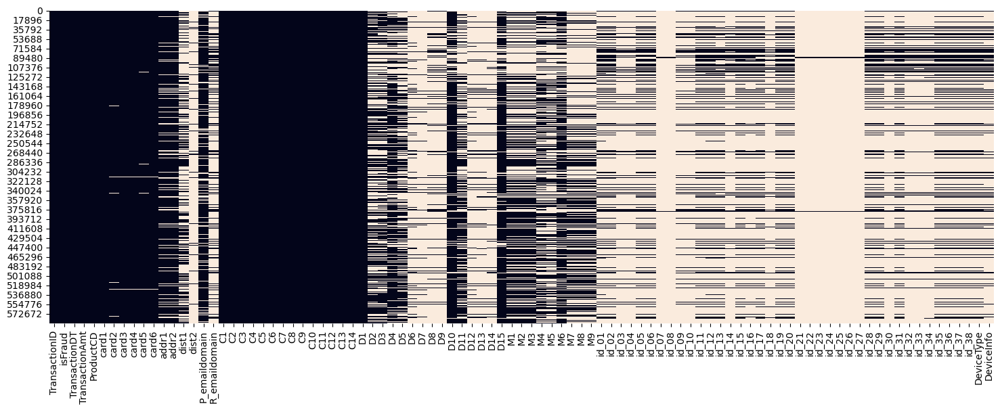

13154

In [13]:
plt.figure(figsize=(18, 6))  # 원하는 사이즈로 조정
sns.heatmap(df.iloc[:,:95].isnull(), cbar=False)
plt.show()

plt.close('all')
gc.collect()

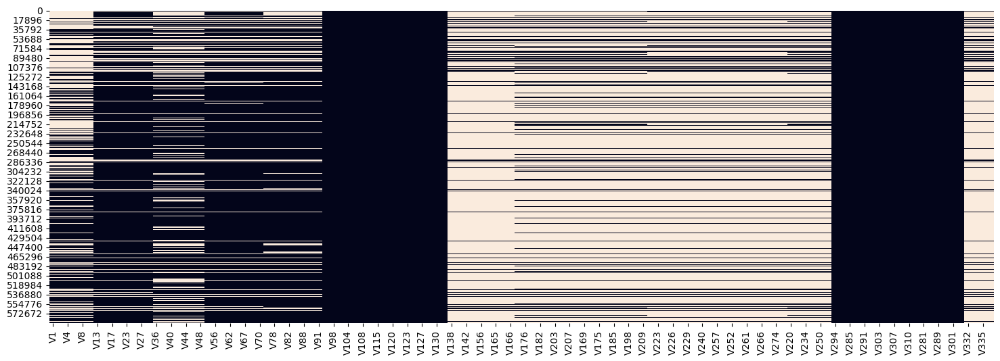

10624

In [80]:
plt.figure(figsize=(18, 6))  # 원하는 사이즈로 조정
sns.heatmap(df.iloc[:,96:].isnull(), cbar=False)
plt.show()

plt.close('all')
gc.collect()

In [10]:
obj_list = list(df.select_dtypes(include=['object']).columns)
df[obj_list]

,ProductCD,card4,card6,P_emaildomain,R_emaildomain,M1,M2,M3,M4,M5,M6,M7,M8,M9,id_12,id_15,id_16,id_23,id_27,id_28,id_29,id_30,id_31,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,W,discover,credit,NaN,NaN,T,T,T,M2,F,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,W,mastercard,credit,gmail.com,NaN,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,W,visa,debit,outlook.com,NaN,T,T,T,M0,F,F,F,F,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,W,mastercard,debit,yahoo.com,NaN,NaN,NaN,NaN,M0,T,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,H,mastercard,credit,gmail.com,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NotFound,New,NotFound,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590535,W,visa,debit,NaN,NaN,T,T,T,M0,T,F,F,F,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590536,W,mastercard,debit,gmail.com,NaN,T,F,F,M0,F,T,F,F,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590537,W,mastercard,debit,gmail.com,NaN,T,F,F,NaN,NaN,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590538,W,mastercard,debit,aol.com,NaN,T,T,T,M0,F,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
num_list = list(df.select_dtypes(include=['float64','float32','float16','int16','int32','int64']).columns)
df[num_list]

,TransactionID,isFraud,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_13,id_14,id_17,id_18,id_19,id_20,id_21,id_22,id_24,id_25,id_26,id_32,V1,V3,V4,V6,V8,V11,V13,V14,V17,V20,V23,V26,V27,V30,V36,V37,V40,V41,V44,V47,V48,V54,V56,V59,V62,V65,V67,V68,V70,V76,V78,V80,V82,V86,V88,V89,V91,V96,V98,V99,V104,V107,V108,V111,V115,V117,V120,V121,V123,V124,V127,V129,V130,V136,V138,V139,V142,V147,V156,V162,V165,V160,V166,V178,V176,V173,V182,V187,V203,V205,V207,V215,V169,V171,V175,V180,V185,V188,V198,V210,V209,V218,V223,V224,V226,V228,V229,V235,V240,V258,V257,V253,V252,V260,V261,V264,V266,V267,V274,V277,V220,V221,V234,V238,V250,V271,V294,V284,V285,V286,V291,V297,V303,V305,V307,V309,V310,V320,V281,V283,V289,V296,V301,V314,V332,V325,V335,V338
0,2987000,0,86400,68.50,13926,NaN,150.0,142.0,315.0,87.0,19.0,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,117.00,0.0,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,117.00,0.0,0.00,0.00,0.0,1.0,0.0,0.0,0.0,0.00,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.00,2755,404.0,150.0,102.0,325.0,87.0,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.00,0.0,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.00,0.0,0.00,0.00,0.0,1.0,0.0,0.0,0.0,0.00,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.00,4663,490.0,150.0,166.0,330.0,87.0,287.0,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.00,0.0,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.00,0.0,0.00,0.00,0.0,1.0,0.0,0.0,0.0,0.00,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.00,18132,567.0,150.0,117.0,476.0,87.0,NaN,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,48.0,0.0,10.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1758.00,0.0,354.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [14]:
cols = list(df.columns)
len(cols)

223

### ◆ 수치형 컬럼 확인
- TransactionDT
- TransactionAmt
- D
- dist

In [9]:
# 낱개 plot
def plot_numerical_distribution(data, col, bins=10):
    """
    Parameters:
    - data: 수치형 데이터 리스트 또는 pandas 시리즈
    - bins: 히스토그램의 bin 개수 (기본값: 10)
    """
    plt.figure(figsize=(10, 6))
    sns.histplot(data[col], bins=bins, kde=True)
    plt.title(f'Numerical Data Distribution : {col}')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.show()

def plot_categorical_distribution(data, col):
    """
    Parameters:
    - data: 카테고리형 데이터 리스트 또는 pandas 시리즈
    """
    plt.figure(figsize=(10, 6))
    sns.countplot(x=data, palette='viridis')
    plt.title(f'Categorical Data Distribution : {col}')
    plt.xlabel('Category')
    plt.ylabel('Frequency')
    plt.show()

In [12]:
plot_numerical_distribution(df, 'D9', bins=24)

NameError: name 'df' is not defined

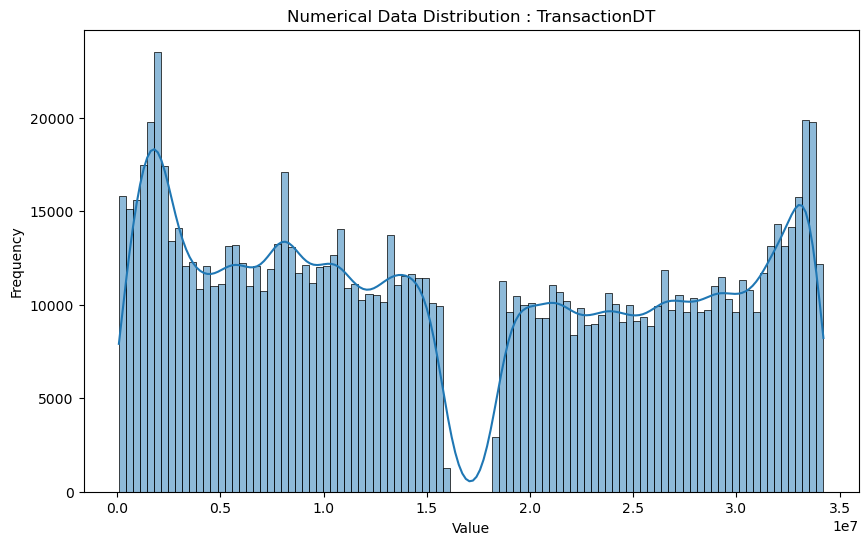

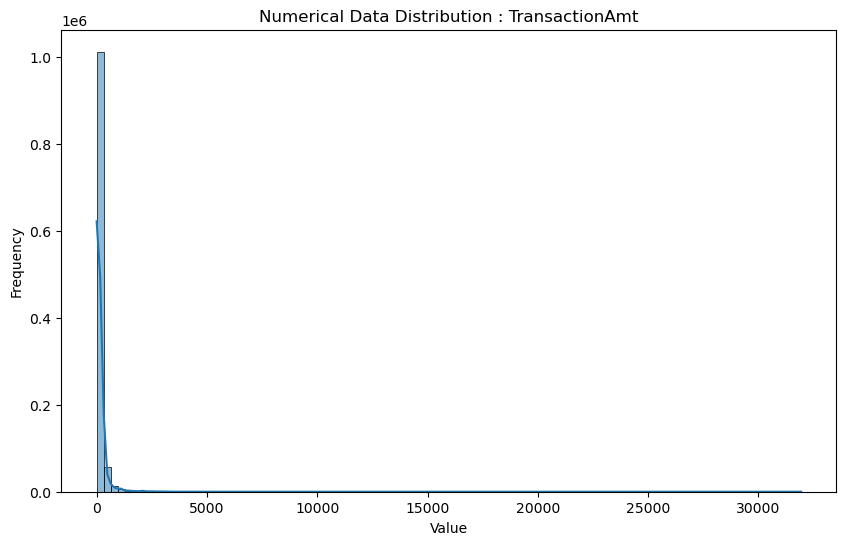

In [42]:
plot_numerical_distribution(df, 'TransactionDT', bins=100)
plot_numerical_distribution(df, 'TransactionAmt', bins=100)

In [ ]:
- TransactionDT : 

In [22]:
def plot_multiple_numerical_distributions(data, cols, target='isFraud', bins=100, 
                                          color1='skyblue', color2='salmon', 
                                          title_size=16, label_size=14):
    """
    Parameters:
    - data: pandas 데이터프레임
    - cols: 시각화할 수치형 데이터가 있는 컬럼 이름 리스트
    - target: 이진 분류 타겟 컬럼 이름
    - bins: 히스토그램의 bin 개수 (기본값: 10)
    - color1: 타겟 0에 대한 히스토그램 막대의 색상 (기본값: 'skyblue')
    - color2: 타겟 1에 대한 히스토그램 막대의 색상 (기본값: 'salmon')
    - title_size: 제목의 서체 크기 (기본값: 16)
    - label_size: 축 라벨의 서체 크기 (기본값: 14)
    """
    n_cols = 4
    n_rows = int(np.ceil(len(cols) / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))
    axes = axes.flatten()
    
    count_class0 = len(data[data[target] == 0])
    count_class1 = len(data[data[target] == 1])
    
    scale_factor = count_class1 / count_class0
    
    for i, col in enumerate(cols):
        data_class0 = data[data[target] == 0][col]
        data_class1 = data[data[target] == 1][col]
        
        sns.histplot(data_class0, bins=bins, kde=True, color=color1, ax=axes[i], label='target=0', stat="density", element="step")
        sns.histplot(data_class1, bins=bins, kde=True, color=color2, ax=axes[i], label='target=1', stat="density", element="step", alpha=0.6)
        
        # 첫 번째 클래스 히스토그램의 높이를 scale_factor로 나누어 줍니다.
        for patch in axes[i].patches:
            if patch.get_label() == 'target=0':
                patch.set_height(patch.get_height() / scale_factor)
        
        axes[i].set_title(f'Numerical Data Distribution : {col}', fontsize=title_size, fontweight='bold')
        axes[i].set_xlabel('Value', fontsize=label_size)
        axes[i].set_ylabel('Density', fontsize=label_size)
        axes[i].tick_params(axis='x', labelsize=label_size - 2)
        axes[i].tick_params(axis='y', labelsize=label_size - 2)
        axes[i].legend()
        axes[i].grid(True)
    
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    plt.show()

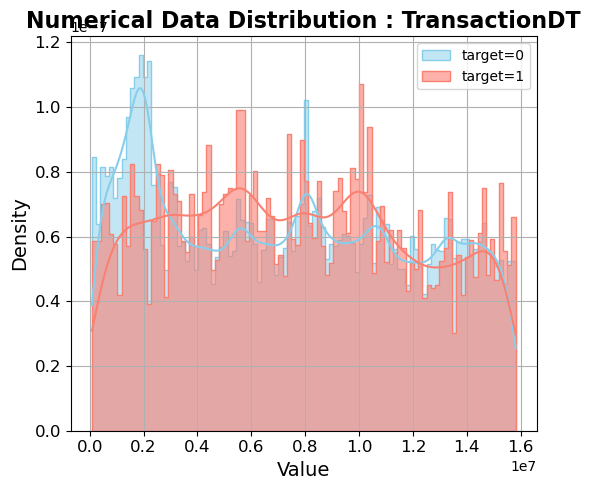

In [23]:
plot_multiple_numerical_distributions(df,['TransactionDT'])

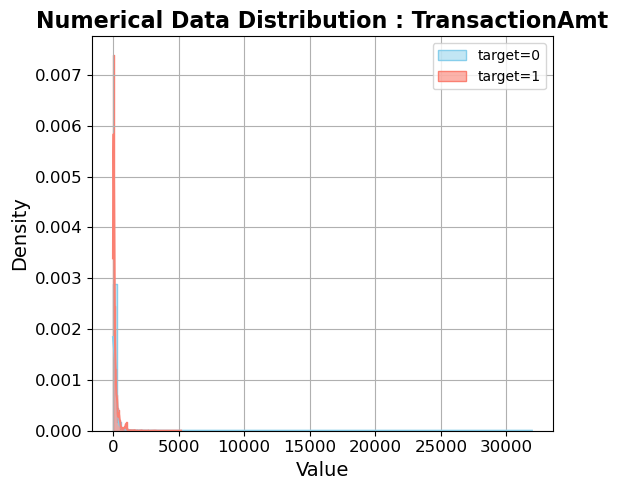

In [24]:
plot_multiple_numerical_distributions(df,['TransactionAmt'])

In [29]:
dcol = [col for col in cols if col[0] == 'D']

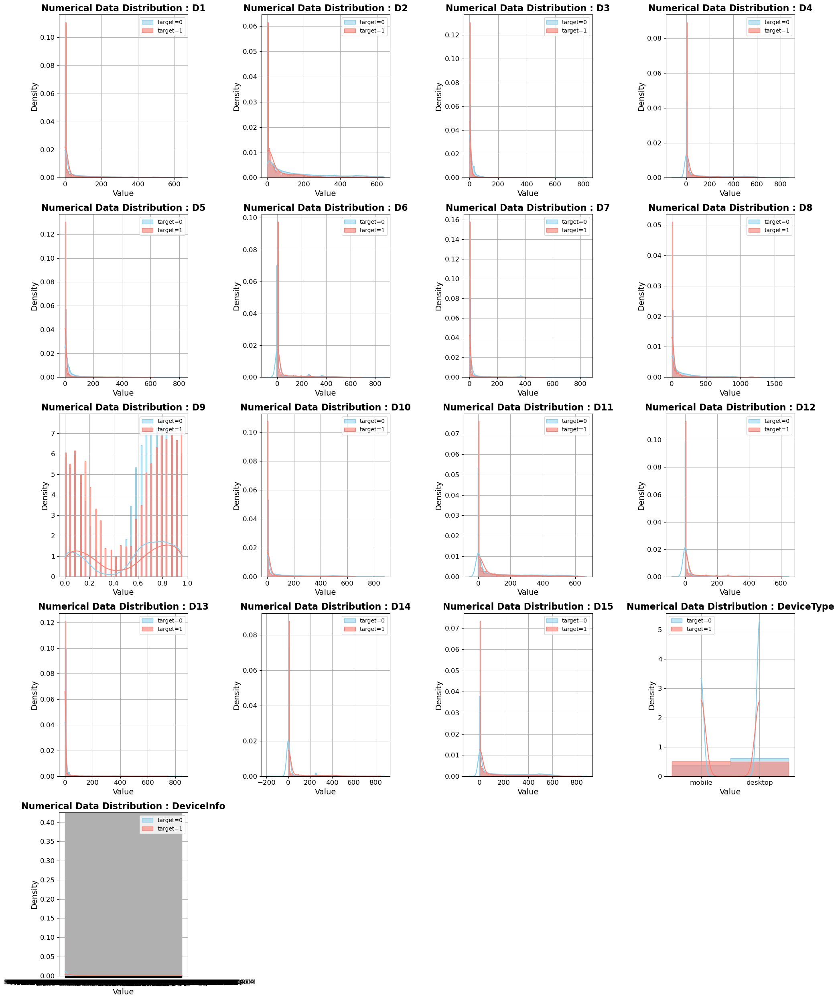

In [30]:
plot_multiple_numerical_distributions(df, dcol, bins=100)

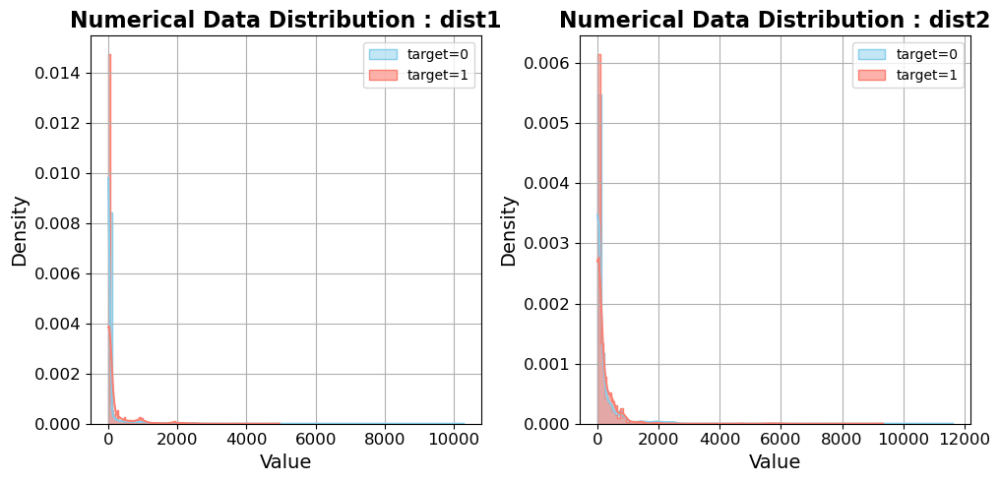

In [31]:
plot_multiple_numerical_distributions(df, ['dist1','dist2'], bins=100)

In [48]:
def plot_categorical_distributions_by_target(data, cols, target='isFraud', title_size=16, label_size=14):
    """
    Parameters:
    - data: pandas 데이터프레임
    - cols: 시각화할 카테고리형 데이터가 있는 컬럼 이름 리스트
    - target: 이진 분류 타겟 컬럼 이름
    - title_size: 제목의 서체 크기 (기본값: 16)
    - label_size: 축 라벨의 서체 크기 (기본값: 14)
    """
    n_cols = 1
    n_rows = len(cols)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, n_rows * 5))
    if n_rows == 1:
        axes = [axes]
        
    count_class0 = len(data[data[target] == 0])
    count_class1 = len(data[data[target] == 1])
    
    scale_factor = count_class0 / count_class1
    
    for i, col in enumerate(cols):
        data_class0 = data[data[target] == 0][col].value_counts().sort_index()
        data_class1 = data[data[target] == 1][col].value_counts().sort_index() * scale_factor
        
        # Combine the two series to ensure the same category order
        combined_index = data_class0.index.union(data_class1.index)
        data_class0 = data_class0.reindex(combined_index, fill_value=0)
        data_class1 = data_class1.reindex(combined_index, fill_value=0)
        
        bar_width = 0.4
        x = np.arange(len(combined_index))
        
        ax = axes[i]
        ax.bar(x - bar_width/2, data_class0, width=bar_width, color='skyblue', align='center', label='target=0')
        ax.bar(x + bar_width/2, data_class1, width=bar_width, color='salmon', align='center', label='target=1')
        
        ax.set_xticks(x)
        ax.set_xticklabels(combined_index, rotation=45, ha='right')
        ax.set_title(f'Categorical Data Distribution : {col}', fontsize=title_size, fontweight='bold')
        ax.set_xlabel(col, fontsize=label_size)
        ax.set_ylabel('Count', fontsize=label_size)
        ax.tick_params(axis='x', labelsize=label_size - 2)
        ax.tick_params(axis='y', labelsize=label_size - 2)
        ax.legend()
        ax.grid(True)
    
    plt.tight_layout()
    plt.show()

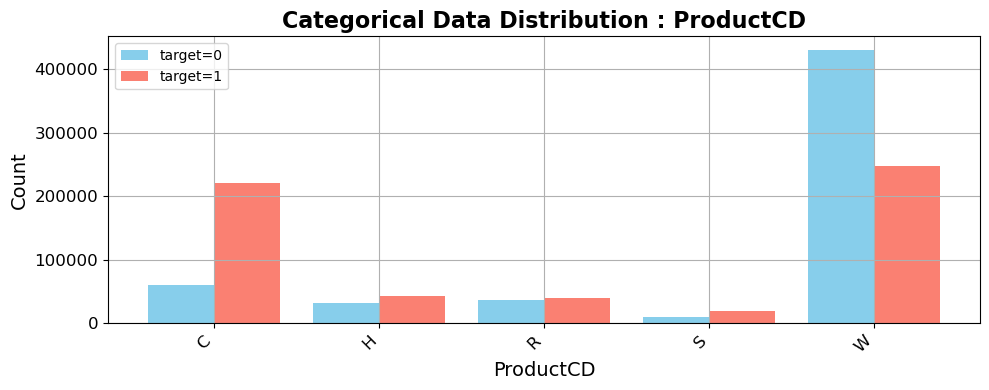

In [30]:
plot_categorical_distributions_by_target(df,['ProductCD'])

In [17]:
c = [c for c in cols if c[:4] == 'card']
c

['card1', 'card2', 'card3', 'card4', 'card5', 'card6']

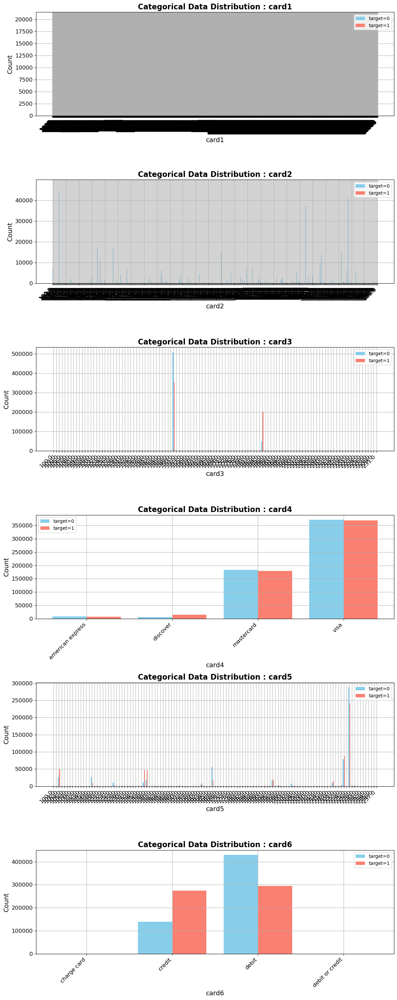

In [18]:
plot_categorical_distributions_by_target(df,c)

In [26]:
obj_list

['ProductCD',
 'card4',
 'card6',
 'P_emaildomain',
 'R_emaildomain',
 'M1',
 'M2',
 'M3',
 'M4',
 'M5',
 'M6',
 'M7',
 'M8',
 'M9',
 'id_12',
 'id_15',
 'id_16',
 'id_23',
 'id_27',
 'id_28',
 'id_29',
 'id_30',
 'id_31',
 'id_33',
 'id_34',
 'id_35',
 'id_36',
 'id_37',
 'id_38',
 'DeviceType',
 'DeviceInfo']

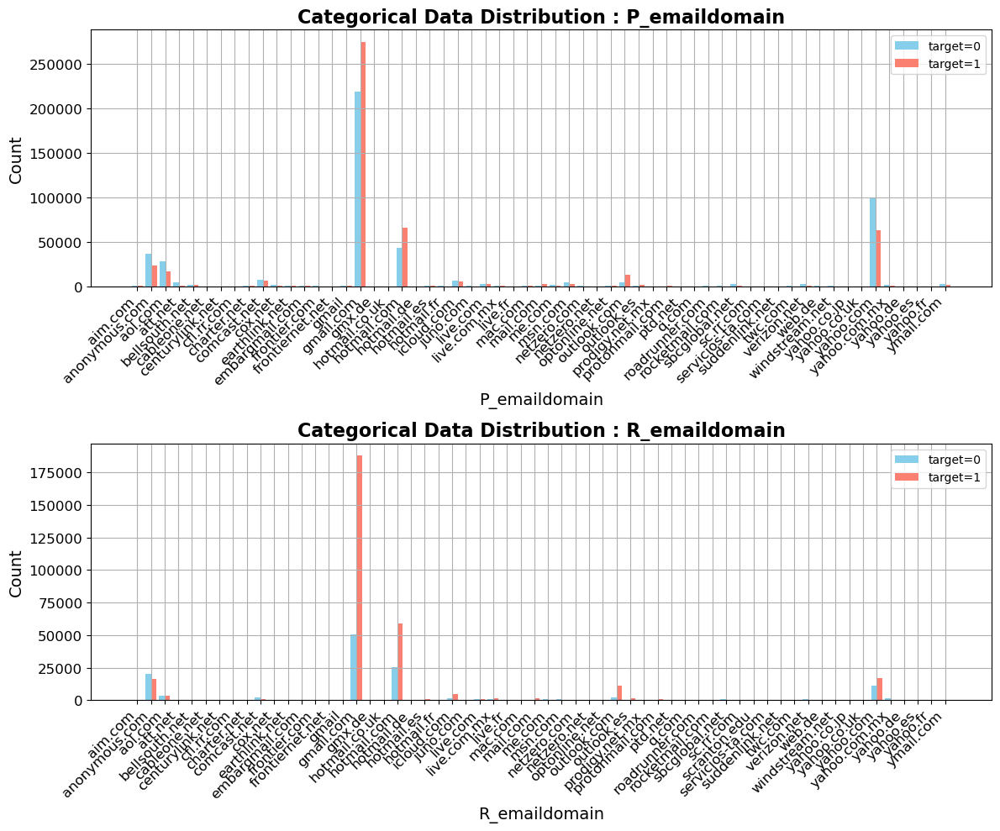

In [36]:
plot_categorical_distributions_by_target(df,['P_emaildomain','R_emaildomain'])

In [38]:
m = ['M1',
 'M2',
 'M3',
 'M4',
 'M5',
 'M6',
 'M7',
 'M8',
 'M9',]

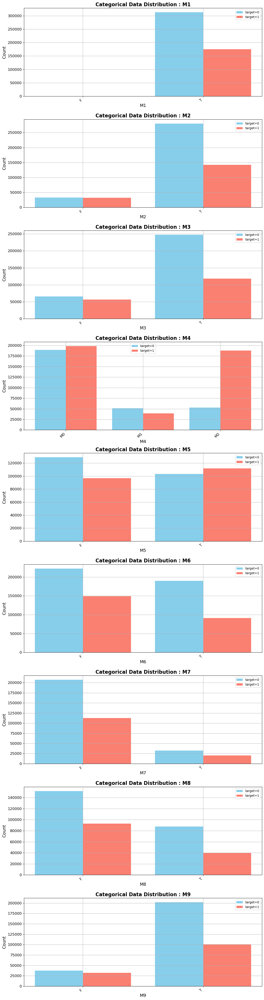

In [40]:
plot_categorical_distributions_by_target(df,m)

In [46]:
c = ['id_12',
 'id_15',
 'id_16',
 'id_23',
 'id_27',
 'id_28',
 'id_29',
 'id_30',
 'id_31',
 'id_33',
 'id_34',
 'id_35',
 'id_36',
 'id_37',
 'id_38',
 'DeviceType',
 'DeviceInfo']

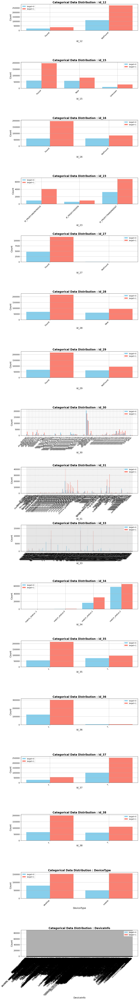

In [48]:
plot_categorical_distributions_by_target(df,c)

## ♜ 결측치 비율 확인

In [15]:
def null_ratio(cols, r=80):
    lst = []
    for c in cols:
        rate = (1-df[c].isnull().sum()/len(df)) * 100
        # print(f'''{c} 데이터 비율 : {rate:.2f} %''')
        if rate >= r:
            lst.append(c)
    print(f'>>>>>{r}% 이상 컬럼 : {lst}')
    
    return lst

In [17]:
lst = null_ratio(obj_list)

>>>>>80% 이상 컬럼 : ['ProductCD', 'card4', 'card6', 'P_emaildomain']


In [18]:
lst2 = null_ratio(num_list)

>>>>>80% 이상 컬럼 : ['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'card1', 'card2', 'card3', 'card5', 'addr1', 'addr2', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D10', 'D15', 'V13', 'V14', 'V17', 'V20', 'V23', 'V26', 'V27', 'V30', 'V54', 'V56', 'V59', 'V62', 'V65', 'V67', 'V68', 'V70', 'V76', 'V78', 'V80', 'V82', 'V86', 'V88', 'V89', 'V91', 'V96', 'V98', 'V99', 'V104', 'V107', 'V108', 'V111', 'V115', 'V117', 'V120', 'V121', 'V123', 'V124', 'V127', 'V129', 'V130', 'V136', 'V294', 'V284', 'V285', 'V286', 'V291', 'V297', 'V303', 'V305', 'V307', 'V309', 'V310', 'V320', 'V281', 'V283', 'V289', 'V296', 'V301', 'V314']


In [21]:
len(lst), len(lst2) # 88개

(4, 86)

In [25]:
cols = df.columns
len(cols)

223

In [27]:
out_cols = list(set(cols) - set(lst) - set(lst2))

In [31]:
# out_cols

['V224',
 'id_24',
 'dist2',
 'M8',
 'V3',
 'V215',
 'id_37',
 'V48',
 'V218',
 'V209',
 'V220',
 'id_25',
 'V198',
 'DeviceType',
 'D4',
 'id_22',
 'V235',
 'id_11',
 'dist1',
 'id_38',
 'V37',
 'V267',
 'id_03',
 'V203',
 'V253',
 'V165',
 'id_08',
 'D3',
 'V188',
 'M5',
 'id_35',
 'V6',
 'V274',
 'V1',
 'id_34',
 'D14',
 'V169',
 'id_29',
 'id_28',
 'id_04',
 'V182',
 'V138',
 'id_30',
 'V40',
 'M7',
 'id_21',
 'D9',
 'M9',
 'V325',
 'M1',
 'V335',
 'D13',
 'id_13',
 'V178',
 'id_26',
 'id_32',
 'V264',
 'V277',
 'D2',
 'id_14',
 'V156',
 'V258',
 'V229',
 'id_02',
 'V210',
 'V47',
 'V250',
 'DeviceInfo',
 'V223',
 'V228',
 'V4',
 'R_emaildomain',
 'V205',
 'V207',
 'V36',
 'V41',
 'id_20',
 'M4',
 'V221',
 'V266',
 'id_18',
 'D8',
 'M6',
 'id_15',
 'V180',
 'V234',
 'D11',
 'M2',
 'V147',
 'V173',
 'V160',
 'id_01',
 'V332',
 'id_06',
 'id_23',
 'id_12',
 'V162',
 'D5',
 'id_07',
 'V185',
 'id_09',
 'id_31',
 'id_27',
 'D6',
 'V271',
 'id_16',
 'V11',
 'V142',
 'V338',
 'D12',
 'V2

In [33]:
def null_class_ratio(df, col, target='isFraud'):
    
    n_df = df[df[col].isnull()]
    not_n_df = df[df[col].notnull()]

    n_df_fraud_ratio = ((n_df[target] == 1).sum()/len(n_df)) * 100
    not_n_df_fraud_ratio = ((not_n_df[target] == 1).sum()/len(not_n_df)) * 100
    
    if len(n_df) == 0:
        print(f'null값이 없는 {col} 열')
    elif abs(not_n_df_fraud_ratio-n_df_fraud_ratio) > 8:
        print(f'''
{col}열의 null값에서 사기 비율 : {n_df_fraud_ratio:.2f}
{col}열의 값이 있는 경우 사기 비율 : {not_n_df_fraud_ratio:.2f}''')

In [45]:
for c in sorted(out_cols):
    null_class_ratio(df,c)


D12열의 null값에서 사기 비율 : 2.48
D12열의 값이 있는 경우 사기 비율 : 11.74

D13열의 null값에서 사기 비율 : 2.62
D13열의 값이 있는 경우 사기 비율 : 11.04

D14열의 null값에서 사기 비율 : 2.55
D14열의 값이 있는 경우 사기 비율 : 11.60

D6열의 null값에서 사기 비율 : 2.50
D6열의 값이 있는 경우 사기 비율 : 10.55

D7열의 null값에서 사기 비율 : 2.70
D7열의 값이 있는 경우 사기 비율 : 14.88

id_03열의 null값에서 사기 비율 : 2.59
id_03열의 값이 있는 경우 사기 비율 : 10.72

id_04열의 null값에서 사기 비율 : 2.59
id_04열의 값이 있는 경우 사기 비율 : 10.72


## ♜ 상관관계 파악

### 1) 1:1

In [29]:
lst_new = lst2+lst

In [37]:
lst2[1:]

['isFraud',
 'TransactionDT',
 'TransactionAmt',
 'card1',
 'card2',
 'card3',
 'card5',
 'addr1',
 'addr2',
 'C1',
 'C2',
 'C3',
 'C4',
 'C5',
 'C6',
 'C7',
 'C8',
 'C9',
 'C10',
 'C11',
 'C12',
 'C13',
 'C14',
 'D1',
 'D10',
 'D15',
 'V13',
 'V14',
 'V17',
 'V20',
 'V23',
 'V26',
 'V27',
 'V30',
 'V54',
 'V56',
 'V59',
 'V62',
 'V65',
 'V67',
 'V68',
 'V70',
 'V76',
 'V78',
 'V80',
 'V82',
 'V86',
 'V88',
 'V89',
 'V91',
 'V96',
 'V98',
 'V99',
 'V104',
 'V107',
 'V108',
 'V111',
 'V115',
 'V117',
 'V120',
 'V121',
 'V123',
 'V124',
 'V127',
 'V129',
 'V130',
 'V136',
 'V294',
 'V284',
 'V285',
 'V286',
 'V291',
 'V297',
 'V303',
 'V305',
 'V307',
 'V309',
 'V310',
 'V320',
 'V281',
 'V283',
 'V289',
 'V296',
 'V301',
 'V314']

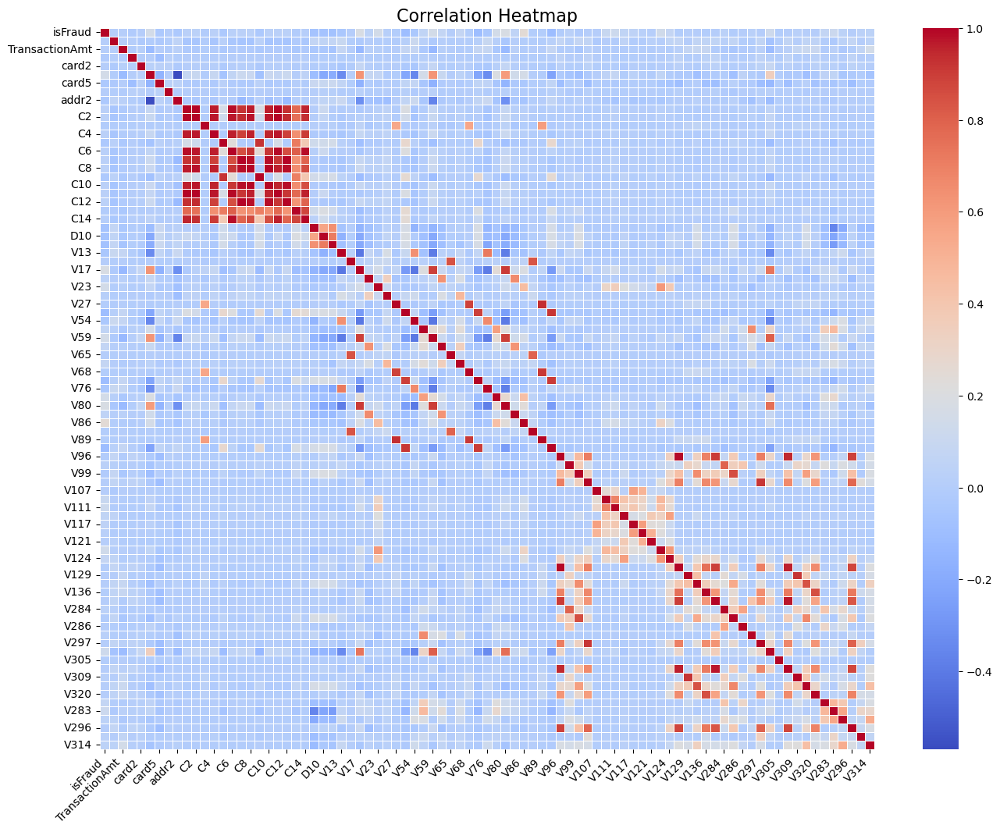

In [13]:
plt.figure(figsize=(16, 12))
correlation_matrix = df[lst2[1:]].corr()
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap", fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks()
plt.show()

### 2) 1:2

In [51]:
# cols = list(df.columns)

In [31]:
card_cols = ['card1', 'card2', 'card3', 'card4', 'card5', 'card6']
arr_dist_cols = ['addr1', 'addr2', 'dist1', 'dist2']
c_cols = [ c for c in cols if c[0] == 'C']
d_cols = [ 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8',
       'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15']
e_cols = ['P_emaildomain', 'R_emaildomain',]
ot_cols = [ 'TransactionDT', 'TransactionAmt','ProductCD']

In [ ]:
# Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt',
#        'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6',
#        'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain',
#        'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11',
#        'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8',
#        'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15',

#### ▶ off

In [33]:
lst3 = [ i for i in lst2 if i[0] != 'V']
print(len(lst3))
lst3 = lst3[3:]

27


In [91]:
df['C1'].value_counts()[:20]

C1
1.0     316791
2.0     105071
3.0      51315
4.0      28845
5.0      17922
6.0      10567
7.0       7263
8.0       5072
9.0       3612
10.0      2904
11.0      2167
12.0      1965
13.0      1460
14.0      1116
15.0       858
16.0       729
17.0       715
18.0       578
0.0        494
19.0       494
20.0       437
Name: count, dtype: int64

In [97]:
len(df['C3'].unique()) # 8195, 13553, 501, 115, 5, 120, 5, 333, 75, 2413, 1700, 60,61, 1495, 1167, 27

27

In [35]:
dff = df.copy()
dff = dff['isFraud'].to_frame()

In [37]:
def add_col(df, df2, cols):
    for i in tqdm(range(len(cols))):
        for j in range(i + 1, len(cols)):
            col1 = cols[i]
            col2 = cols[j]
            col_name = f'{col1}_{col2}'
            df2[col_name] = df[col1].astype(str) + '_' + df[col2].astype(str)
    return df2

In [43]:
del df;
gc.collect()

0

In [39]:
dff10 = add_col(df,dff,lst3)

  0%|          | 0/24 [00:00<?, ?it/s]

In [41]:
dff10.shape

(590540, 277)

In [52]:
dff10.columns.to_list()

['isFraud',
 'TransactionAmt_card1',
 'TransactionAmt_card2',
 'TransactionAmt_card3',
 'TransactionAmt_card5',
 'TransactionAmt_addr1',
 'TransactionAmt_addr2',
 'TransactionAmt_C1',
 'TransactionAmt_C2',
 'TransactionAmt_C3',
 'TransactionAmt_C4',
 'TransactionAmt_C5',
 'TransactionAmt_C6',
 'TransactionAmt_C7',
 'TransactionAmt_C8',
 'TransactionAmt_C9',
 'TransactionAmt_C10',
 'TransactionAmt_C11',
 'TransactionAmt_C12',
 'TransactionAmt_C13',
 'TransactionAmt_C14',
 'TransactionAmt_D1',
 'TransactionAmt_D10',
 'TransactionAmt_D15',
 'card1_card2',
 'card1_card3',
 'card1_card5',
 'card1_addr1',
 'card1_addr2',
 'card1_C1',
 'card1_C2',
 'card1_C3',
 'card1_C4',
 'card1_C5',
 'card1_C6',
 'card1_C7',
 'card1_C8',
 'card1_C9',
 'card1_C10',
 'card1_C11',
 'card1_C12',
 'card1_C13',
 'card1_C14',
 'card1_D1',
 'card1_D10',
 'card1_D15',
 'card2_card3',
 'card2_card5',
 'card2_addr1',
 'card2_addr2',
 'card2_C1',
 'card2_C2',
 'card2_C3',
 'card2_C4',
 'card2_C5',
 'card2_C6',
 'card2

In [54]:
amt_cols = ['TransactionAmt_card1',
 'TransactionAmt_card2',
 'TransactionAmt_card3',
 'TransactionAmt_card5',
 'TransactionAmt_addr1',
 'TransactionAmt_addr2',
 'TransactionAmt_C1',
 'TransactionAmt_C2',
 'TransactionAmt_C3',
 'TransactionAmt_C4',
 'TransactionAmt_C5',
 'TransactionAmt_C6',
 'TransactionAmt_C7',
 'TransactionAmt_C8',
 'TransactionAmt_C9',
 'TransactionAmt_C10',
 'TransactionAmt_C11',
 'TransactionAmt_C12',
 'TransactionAmt_C13',
 'TransactionAmt_C14',
 'TransactionAmt_D1',
 'TransactionAmt_D10',
 'TransactionAmt_D15',]

In [180]:
card1_cols = ['card1_card2',
 'card1_card3',
 'card1_card5',
 'card1_addr1',
 'card1_addr2',
 'card1_C1',
 'card1_C2',
 'card1_C3',
 'card1_C4',
 'card1_C5',
 'card1_C6',
 'card1_C7',
 'card1_C8',
 'card1_C9',
 'card1_C10',
 'card1_C11',
 'card1_C12',
 'card1_C13',
 'card1_C14',
 'card1_D1',
 'card1_D10',
 'card1_D15',]

In [172]:
def combination_fraud_rate(df, col, n=500):
    top_values = dff10[col].value_counts().head(n).index
    filtered_df = dff10[dff10[col].isin(top_values)]
    counts= filtered_df.groupby(col)['isFraud'].value_counts().unstack().fillna(0)

    counts['ratio'] = round( counts[1] / (counts[0]+counts[1]) , 3)
    counts['total_ratio'] = round((counts[0]+counts[1]) / len(df)*100, 2)
    result = counts[counts['ratio'] >= 0.1].sort_values(by='ratio',ascending=False)
    # import ace_tools as tools; 
    # tools.display_dataframe_to_user(name="Top 10 Transaction Amounts Class Ratios", dataframe=result)
    print(result)
    print('#####################################################')


In [182]:
for c in card1_cols:
    combination_fraud_rate(dff10, c)

isFraud           0      1  ratio  total_ratio
card1_card2                                   
2939_111.0     97.0   78.0  0.446         0.03
2801_130.0    115.0   80.0  0.410         0.03
3867_296.0    119.0   70.0  0.370         0.03
2801_296.0    139.0   76.0  0.353         0.04
15063_nan     401.0  216.0  0.350         0.10
9917_142.0    609.0  305.0  0.334         0.15
14276_177.0   638.0  252.0  0.283         0.15
3867_130.0    120.0   46.0  0.277         0.03
13526_529.0   249.0   90.0  0.265         0.06
5287_553.0    132.0   47.0  0.263         0.03
15944_266.0   149.0   53.0  0.262         0.03
13623_585.0   249.0   83.0  0.250         0.06
10876_104.0   562.0  186.0  0.249         0.13
16346_324.0   251.0   80.0  0.242         0.06
5347_408.0    140.0   42.0  0.231         0.03
4504_500.0    762.0  210.0  0.216         0.16
9633_130.0   1723.0  465.0  0.213         0.37
10086_500.0   347.0   93.0  0.211         0.07
10568_204.0   732.0  190.0  0.206         0.16
13413_103.0  

#### ▶ new

In [191]:
dff_list = list(dff10.columns[1:])

In [208]:
from sklearn.preprocessing import LabelEncoder, StandardScaler

In [ ]:
encoder = LabelEncoder()
object_columns = dff10.select_dtypes(include=['object']).columns

for col in object_columns:
    dff10[col] = encoder.fit_transform(dff10[col])

In [204]:
dff10

,isFraud,TransactionAmt_card1,TransactionAmt_card2,TransactionAmt_card3,TransactionAmt_card5,TransactionAmt_addr1,TransactionAmt_addr2,TransactionAmt_C1,TransactionAmt_C2,TransactionAmt_C3,TransactionAmt_C4,TransactionAmt_C5,TransactionAmt_C6,TransactionAmt_C7,TransactionAmt_C8,TransactionAmt_C9,TransactionAmt_C10,TransactionAmt_C11,TransactionAmt_C12,TransactionAmt_C13,TransactionAmt_C14,TransactionAmt_D1,TransactionAmt_D10,TransactionAmt_D15,card1_card2,card1_card3,card1_card5,card1_addr1,card1_addr2,card1_C1,card1_C2,card1_C3,card1_C4,card1_C5,card1_C6,card1_C7,card1_C8,card1_C9,card1_C10,card1_C11,card1_C12,card1_C13,card1_C14,card1_D1,card1_D10,card1_D15,card2_card3,card2_card5,card2_addr1,card2_addr2,card2_C1,card2_C2,card2_C3,card2_C4,card2_C5,card2_C6,card2_C7,card2_C8,card2_C9,card2_C10,card2_C11,card2_C12,card2_C13,card2_C14,card2_D1,card2_D10,card2_D15,card3_card5,card3_addr1,card3_addr2,card3_C1,card3_C2,card3_C3,card3_C4,card3_C5,card3_C6,card3_C7,card3_C8,card3_C9,card3_C10,card3_C11,card3_C12,card3_C13,card3_C14,card3_D1,card3_D10,card3_D15,card5_addr1,card5_addr2,card5_C1,card5_C2,card5_C3,card5_C4,card5_C5,card5_C6,card5_C7,card5_C8,card5_C9,card5_C10,card5_C11,card5_C12,card5_C13,card5_C14,card5_D1,card5_D10,card5_D15,addr1_addr2,addr1_C1,addr1_C2,addr1_C3,addr1_C4,addr1_C5,addr1_C6,addr1_C7,addr1_C8,addr1_C9,addr1_C10,addr1_C11,addr1_C12,addr1_C13,addr1_C14,addr1_D1,addr1_D10,addr1_D15,addr2_C1,addr2_C2,addr2_C3,addr2_C4,addr2_C5,addr2_C6,addr2_C7,addr2_C8,addr2_C9,addr2_C10,addr2_C11,addr2_C12,addr2_C13,addr2_C14,addr2_D1,addr2_D10,addr2_D15,C1_C2,C1_C3,C1_C4,C1_C5,C1_C6,C1_C7,C1_C8,C1_C9,C1_C10,C1_C11,C1_C12,C1_C13,C1_C14,C1_D1,C1_D10,C1_D15,C2_C3,C2_C4,C2_C5,C2_C6,C2_C7,C2_C8,C2_C9,C2_C10,C2_C11,C2_C12,C2_C13,C2_C14,C2_D1,C2_D10,C2_D15,C3_C4,C3_C5,C3_C6,C3_C7,C3_C8,C3_C9,C3_C10,C3_C11,C3_C12,C3_C13,C3_C14,C3_D1,C3_D10,C3_D15,C4_C5,C4_C6,C4_C7,C4_C8,C4_C9,C4_C10,C4_C11,C4_C12,C4_C13,C4_C14,C4_D1,C4_D10,C4_D15,C5_C6,C5_C7,C5_C8,C5_C9,C5_C10,C5_C11,C5_C12,C5_C13,C5_C14,C5_D1,C5_D10,C5_D15,C6_C7,C6_C8,C6_C9,C6_C10,C6_C11,C6_C12,C6_C13,C6_C14,C6_D1,C6_D10,C6_D15,C7_C8,C7_C9,C7_C10,C7_C11,C7_C12,C7_C13,C7_C14,C7_D1,C7_D10,C7_D15,C8_C9,C8_C10,C8_C11,C8_C12,C8_C13,C8_C14,C8_D1,C8_D10,C8_D15,C9_C10,C9_C11,C9_C12,C9_C13,C9_C14,C9_D1,C9_D10,C9_D15,C10_C11,C10_C12,C10_C13,C10_C14,C10_D1,C10_D10,C10_D15,C11_C12,C11_C13,C11_C14,C11_D1,C11_D10,C11_D15,C12_C13,C12_C14,C12_D1,C12_D10,C12_D15,C13_C14,C13_D1,C13_D10,C13_D15,C14_D1,C14_D10,C14_D15,D1_D10,D1_D15,D10_D15
0,0,163932,73590,14399,27697,33903,9684,31831,37434,7055,14649,21447,27424,13655,18194,21678,18765,27376,15789,53319,28776,84142,78055,92845,3656,3569,3644,9918,3704,12838,13268,3603,5808,10199,11665,4357,6444,10751,6497,11014,5006,25840,12328,42295,43039,47601,648,1608,7635,901,16413,16617,742,4351,11929,13860,2894,5051,10693,5283,13981,3666,34240,14057,67709,67280,75789,296,442,136,408,565,47,274,158,353,257,343,163,318,644,270,551,314,1089,571,1062,846,121,1808,1721,60,970,784,1429,805,1089,593,1014,1545,933,2440,1380,3487,3097,3723,249,4329,4131,227,929,3879,3556,328,943,2866,979,3698,409,9442,3691,15644,16088,16935,252,267,68,192,67,193,191,206,75,211,458,205,245,183,493,217,436,26,1,8,1,9,8,9,4,6,10,8,6,2,150,45,70,1,4,4,5,4,4,3,4,7,5,17,6,81,36,55,0,0,1,0,0,1,0,493,0,1,1,46,35,13,0,1,0,0,1,0,112,0,1,1,46,35,10,1,0,0,1,0,472,0,1,1,46,35,8,2,49,9,201,39,5,266,34,688,819,840,0,1,0,255,0,1,1,46,35,10,1,0,112,0,1,1,46,35,10,1122,1291,1066,1288,1049,688,850,855,112,0,1,1,46,35,11,776,8016,3657,8915,9223,9738,1,1,46,35,9,2,469,488,578,482,488,581,11259,11364,7271
1,0,83684,37375,7816,14579,17397,5535,16953,20166,4058,8281,11301,14574,7592,10164,11468,10581,14698,8736,27717,15398,43677,39843,47838,8483,8300,8467,23139,8590,30803,31798,8367,13843,24295,28162,10264,15290,25780,15393,26520,11819,62184,29598,100970,102770,113720,325,899,4361,500,9440,9625,446,2415,7005,7918,1565,2810,6198,2929,7952,1994,19784,7977,38721,38160,43112,269,447,136,408,565,47,274,158,35

In [228]:
features = dff10.drop(columns=['isFraud'])
scaler = StandardScaler()
scaled_feature = pd.DataFrame(scaler.fit_transform(features), columns=features.columns)
scaled_df = pd.concat([dff10[['isFraud']].reset_index(drop=True), scaled_feature], axis=1)

In [232]:
scaled_df.to_csv('scaled_combinfeature.csv')

## ◆ 3-sigma Rule 이상탐지

In [25]:
df['TransactionAmt'].dtypes

dtype('float64')

In [162]:
def plot_transaction_data(df, y_column, hue_column='isFraud'):
    high = df[y_column].mean() + 2 * df[y_column].std()
    low = df[y_column].mean() - 2 * df[y_column].std()

    plt.style.use(['dark_background'])

    sns.scatterplot(x=df.index, y=df[y_column], hue=df[hue_column], 
                    palette={0.0:"blue",1.0:"red"})
    plt.axhline(y=low, color='r', linewidth=1)
    plt.axhline(y=high, color='r', linewidth=1)
    plt.xlabel("Index")
    plt.ylabel(y_column)
    plt.title(f"sigma rule anomaly detection : {y_column}")
    plt.gcf().set_size_inches(15, 5)
    plt.show()

    normal = df[(df[y_column] < high) & (df[y_column] > low)]
    outlier = df[(df[y_column] >= high) | (df[y_column] <= low)]

    outlier_ratio = len(outlier) / len(df)
    normal_ratio = 1 - outlier_ratio

    outlier_fraud_ratio = outlier[hue_column].value_counts() / len(outlier)
    normal_fraud_ratio = normal[hue_column].value_counts() / len(normal)

    print(f'''이상치 비율 : {outlier_ratio}
########################################
outlier_fraud_ratio 
{outlier_fraud_ratio}
########################################
normal_fraud_ratio
{normal_fraud_ratio}''')

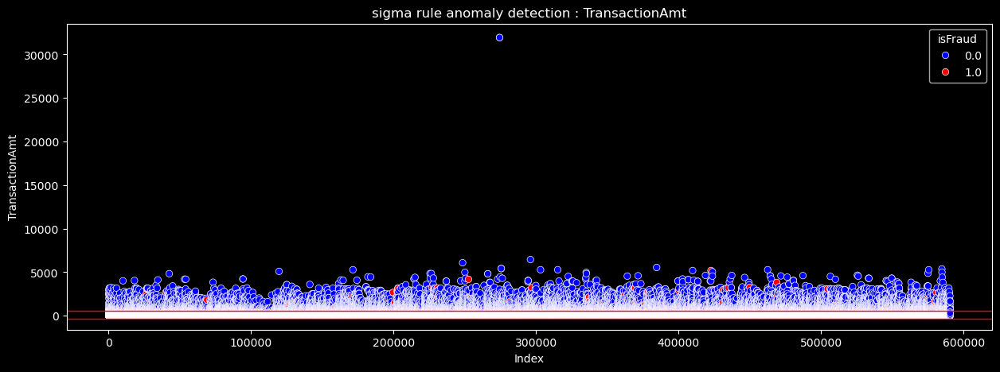

이상치 비율 : 0.02655196938395367
########################################
outlier_fraud_ratio 
isFraud
0.0    0.952423
1.0    0.047577
Name: count, dtype: float64
########################################
normal_fraud_ratio
isFraud
0.0    0.965353
1.0    0.034647
Name: count, dtype: float64


In [170]:
plot_transaction_data(train,'TransactionAmt')

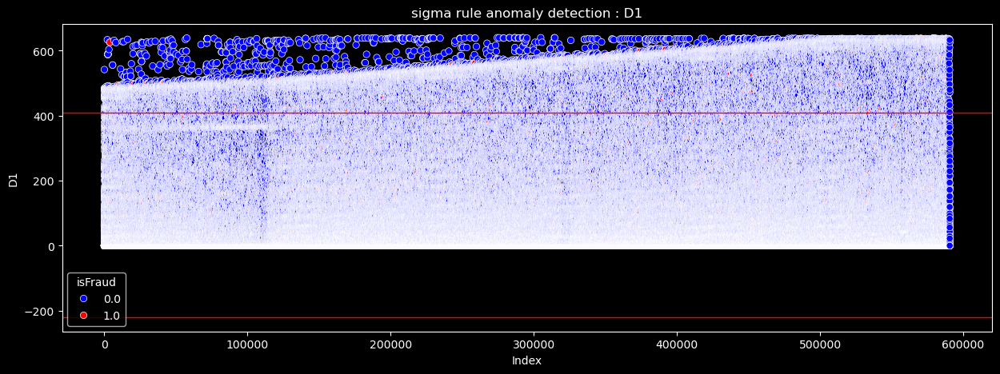

이상치 비율 : 0.08047719036813764
########################################
outlier_fraud_ratio 
isFraud
0.0    0.988364
1.0    0.011636
Name: count, dtype: float64
########################################
normal_fraud_ratio
isFraud
0.0    0.962964
1.0    0.037036
Name: count, dtype: float64


In [169]:
plot_transaction_data(train,'D1')

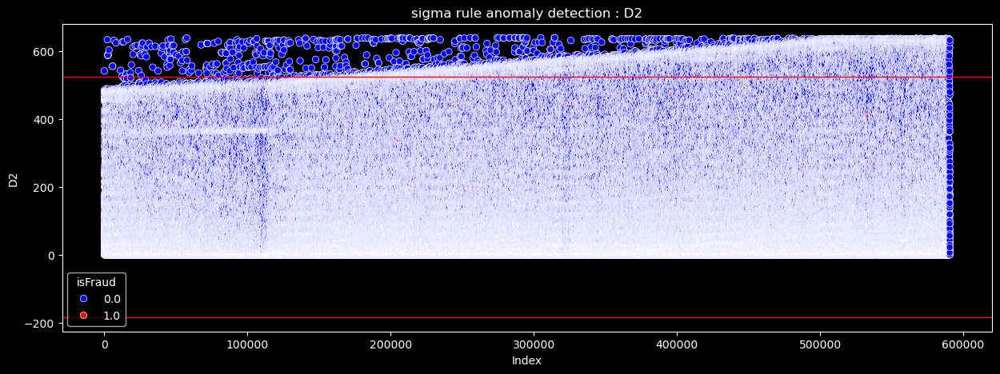

이상치 비율 : 0.031645612490263146
########################################
outlier_fraud_ratio 
isFraud
0.0    0.991117
1.0    0.008883
Name: count, dtype: float64
########################################
normal_fraud_ratio
isFraud
0.0    0.973531
1.0    0.026469
Name: count, dtype: float64


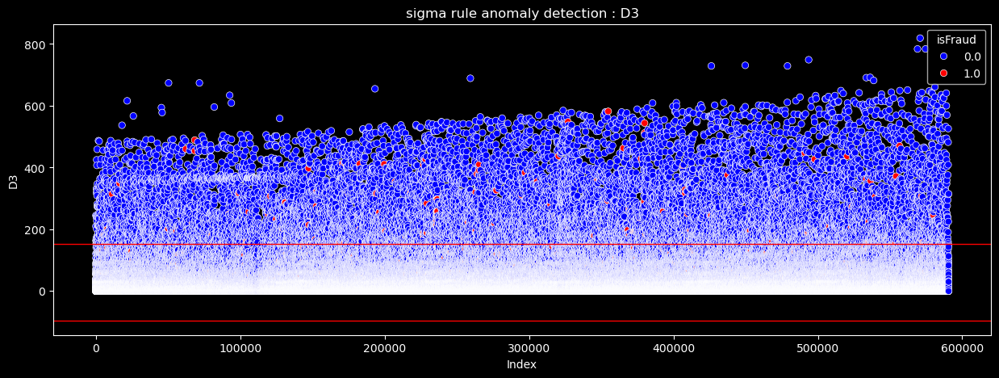

이상치 비율 : 0.02288075320892742
########################################
outlier_fraud_ratio 
isFraud
0.0    0.986308
1.0    0.013692
Name: count, dtype: float64
########################################
normal_fraud_ratio
isFraud
0.0    0.96997
1.0    0.03003
Name: count, dtype: float64


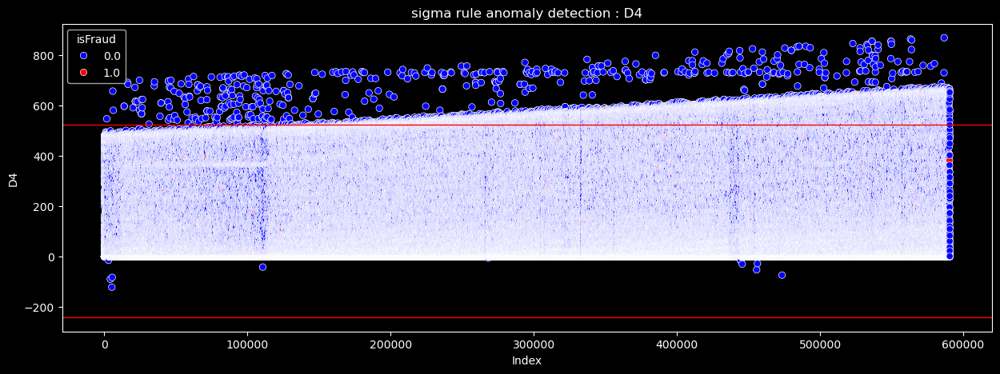

이상치 비율 : 0.046159447285535275
########################################
outlier_fraud_ratio 
isFraud
0.0    0.988151
1.0    0.011849
Name: count, dtype: float64
########################################
normal_fraud_ratio
isFraud
0.0    0.963881
1.0    0.036119
Name: count, dtype: float64


In [173]:
for c in ['D2','D3','D4']:
    plot_transaction_data(train,c)

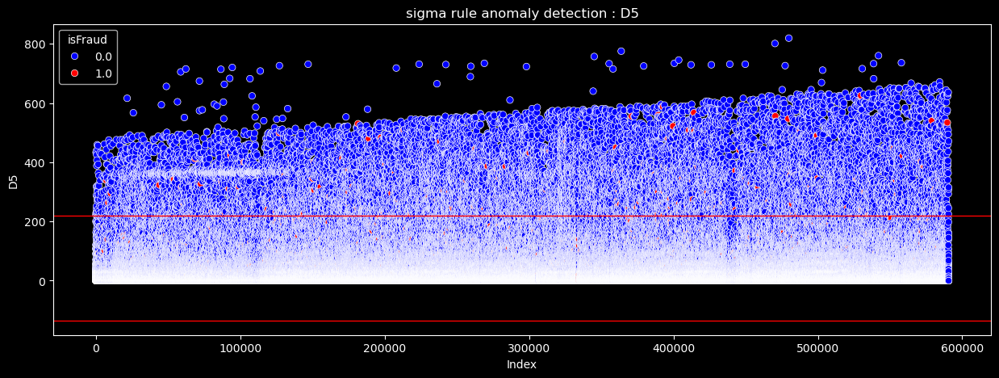

이상치 비율 : 0.027002404578860027
########################################
outlier_fraud_ratio 
isFraud
0.0    0.987395
1.0    0.012605
Name: count, dtype: float64
########################################
normal_fraud_ratio
isFraud
0.0    0.959664
1.0    0.040336
Name: count, dtype: float64


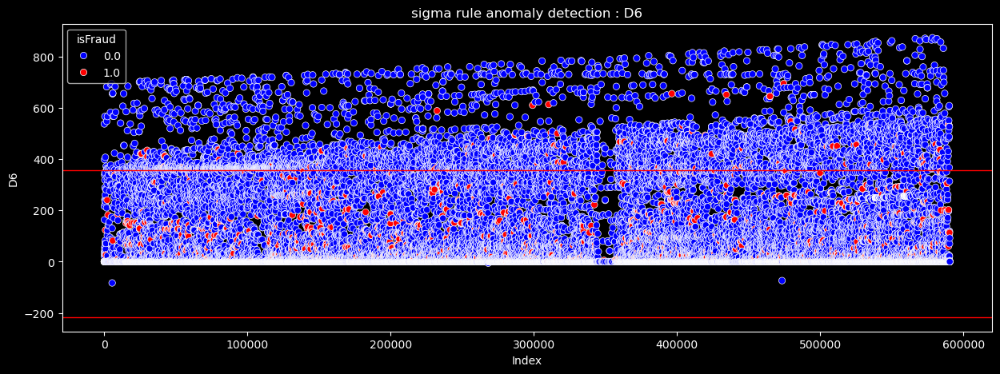

이상치 비율 : 0.010002709384631017
########################################
outlier_fraud_ratio 
isFraud
0.0    0.956323
1.0    0.043677
Name: count, dtype: float64
########################################
normal_fraud_ratio
isFraud
0.0    0.88912
1.0    0.11088
Name: count, dtype: float64


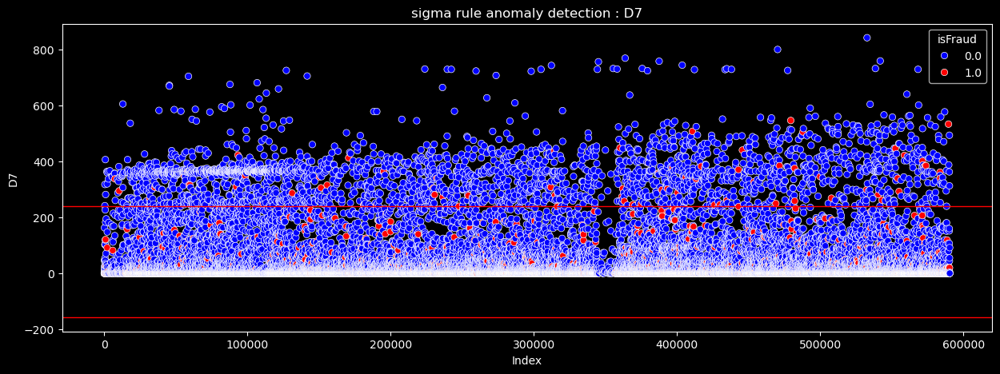

이상치 비율 : 0.004749889931249365
########################################
outlier_fraud_ratio 
isFraud
0.0    0.973619
1.0    0.026381
Name: count, dtype: float64
########################################
normal_fraud_ratio
isFraud
0.0    0.841715
1.0    0.158285
Name: count, dtype: float64


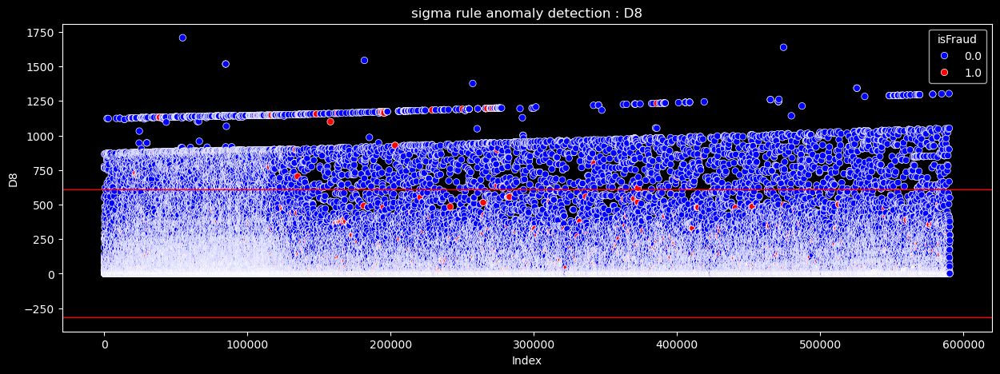

이상치 비율 : 0.008583669184136554
########################################
outlier_fraud_ratio 
isFraud
0.0    0.983429
1.0    0.016571
Name: count, dtype: float64
########################################
normal_fraud_ratio
isFraud
0.0    0.889159
1.0    0.110841
Name: count, dtype: float64


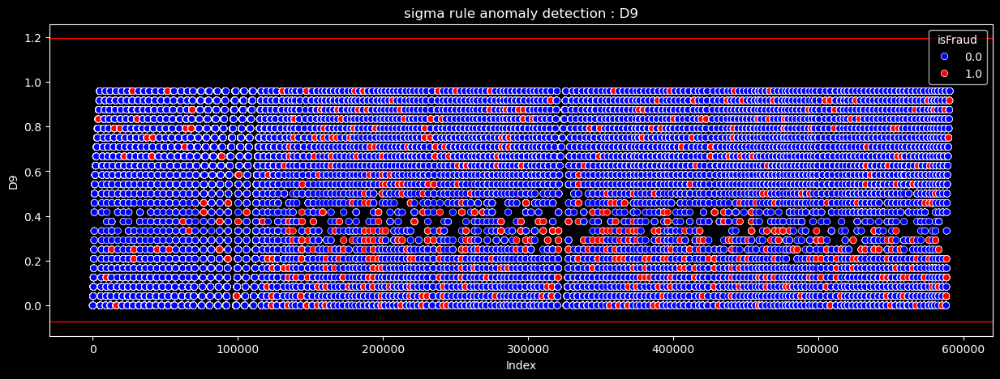

이상치 비율 : 0.0
########################################
outlier_fraud_ratio 
Series([], Name: count, dtype: float64)
########################################
normal_fraud_ratio
isFraud
0.0    0.895537
1.0    0.104463
Name: count, dtype: float64


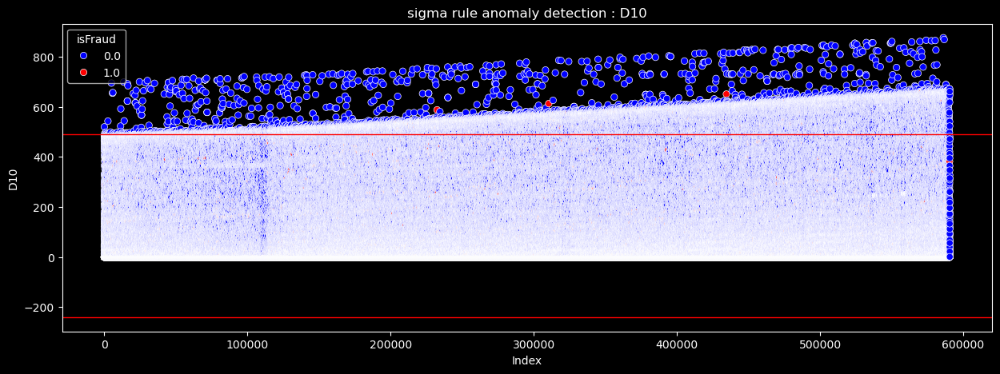

이상치 비율 : 0.07022724963592644
########################################
outlier_fraud_ratio 
isFraud
0.0    0.988764
1.0    0.011236
Name: count, dtype: float64
########################################
normal_fraud_ratio
isFraud
0.0    0.965519
1.0    0.034481
Name: count, dtype: float64


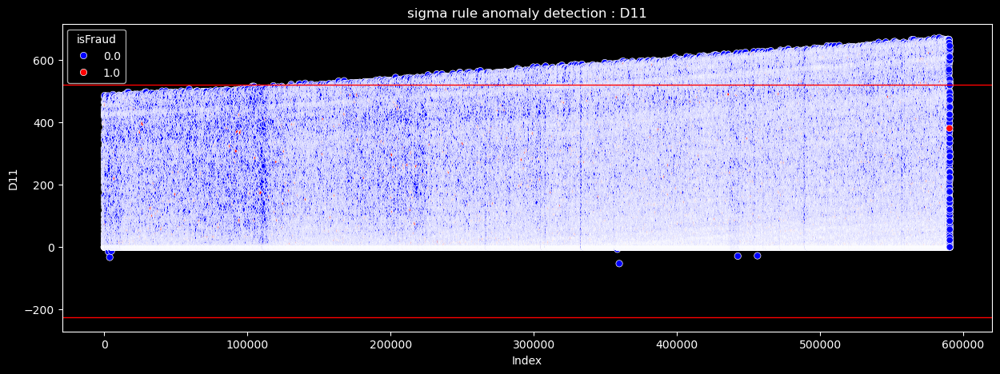

이상치 비율 : 0.030961492870931688
########################################
outlier_fraud_ratio 
isFraud
0.0    0.991577
1.0    0.008423
Name: count, dtype: float64
########################################
normal_fraud_ratio
isFraud
0.0    0.979684
1.0    0.020316
Name: count, dtype: float64


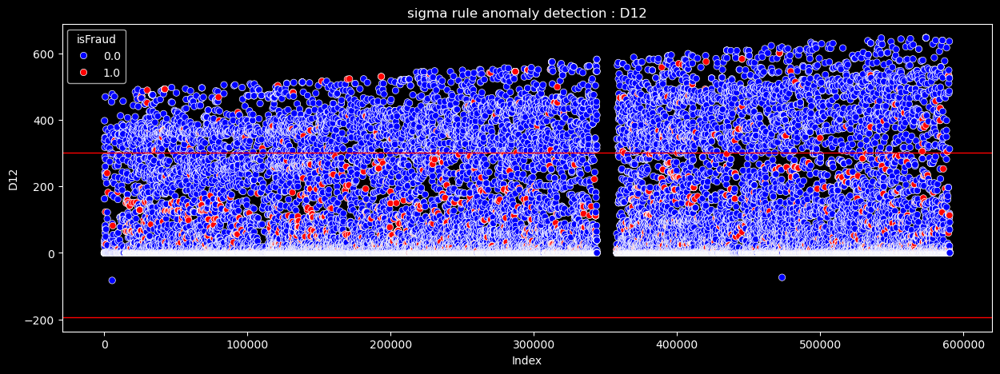

이상치 비율 : 0.009166186879804925
########################################
outlier_fraud_ratio 
isFraud
0.0    0.947534
1.0    0.052466
Name: count, dtype: float64
########################################
normal_fraud_ratio
isFraud
0.0    0.876669
1.0    0.123331
Name: count, dtype: float64


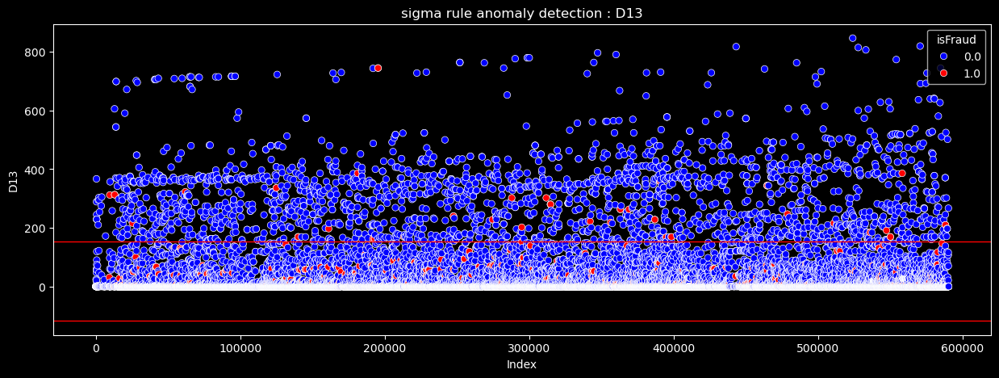

이상치 비율 : 0.004111491177566295
########################################
outlier_fraud_ratio 
isFraud
0.0    0.974465
1.0    0.025535
Name: count, dtype: float64
########################################
normal_fraud_ratio
isFraud
0.0    0.88618
1.0    0.11382
Name: count, dtype: float64


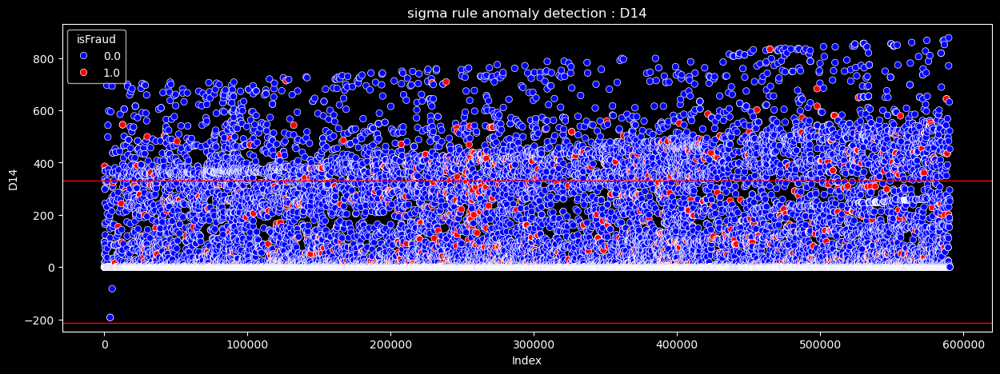

이상치 비율 : 0.008273783316964135
########################################
outlier_fraud_ratio 
isFraud
0.0    0.890913
1.0    0.109087
Name: count, dtype: float64
########################################
normal_fraud_ratio
isFraud
0.0    0.883423
1.0    0.116577
Name: count, dtype: float64


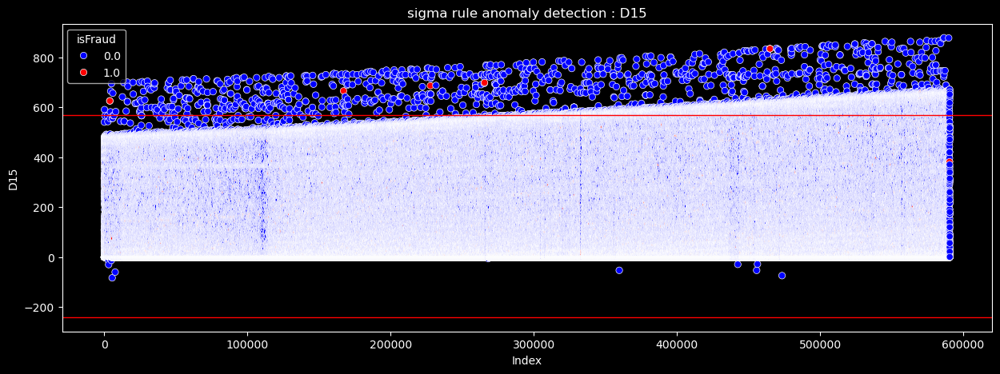

이상치 비율 : 0.04038676465607749
########################################
outlier_fraud_ratio 
isFraud
0.0    0.99174
1.0    0.00826
Name: count, dtype: float64
########################################
normal_fraud_ratio
isFraud
0.0    0.9661
1.0    0.0339
Name: count, dtype: float64


In [185]:
for c in d4_d15:
    plot_transaction_data(train,c)

In [175]:
dcols = [col for col in cols if col[0] == 'D']

#### ex)

In [89]:
normal = df[( df['TransactionAmt'] < high ) & ( df['TransactionAmt'] > low )]
outlier = df[( df['TransactionAmt'] >= high ) | ( df['TransactionAmt'] <= low )]

In [90]:
len(outlier) / len(df)

0.02593255203325462

In [99]:
outlier['isFraud'].value_counts()/len(outlier)

isFraud
0.0    0.952233
1.0    0.047767
Name: count, dtype: float64

In [101]:
normal['isFraud'].value_counts()/len(normal)

isFraud
0.0    0.965354
1.0    0.034646
Name: count, dtype: float64

## ◆ box plot

In [195]:
def plot_and_analyze_iqr(df, y_column, hue_column='isFraud', palette=None, title=None):
    # IQR 계산
    Q1 = df[y_column].quantile(0.25)
    Q3 = df[y_column].quantile(0.75)
    IQR = Q3 - Q1
    low = Q1 - 1.5 * IQR
    high = Q3 + 1.5 * IQR
    
    # 정상 데이터와 이상치 분리
    normal = df[(df[y_column] >= low) & (df[y_column] <= high)]
    outlier = df[(df[y_column] < low) | (df[y_column] > high)]
    
    # 그래프 생성
    plt.style.use(['ggplot'])

    sns.boxplot(x=df[hue_column], y=df[y_column],
                    palette=sns.color_palette('Dark2'))
    plt.xlabel(f"{hue_column}")
    plt.ylabel(f"{y_column}")
    plt.title(f'box plot anomaly detection : {y_column}')  # 제목 추가
    plt.gcf().set_size_inches(15, 5)
    plt.show()

    # 비율 계산
    outlier_ratio = len(outlier) / len(df)
    normal_ratio = 1 - outlier_ratio

    outlier_fraud_ratio = outlier[hue_column].value_counts() / len(outlier)
    normal_fraud_ratio = normal[hue_column].value_counts() / len(normal)
    
    # 결과 출력
    print(f"Outlier Ratio: {outlier_ratio:.2%}")
    print(f"Normal Ratio: {normal_ratio:.2%}")
    print("\nOutlier 'isFraud' Class Distribution:")
    print(outlier_fraud_ratio)
    print("\nNormal 'isFraud' Class Distribution:")
    print(normal_fraud_ratio)


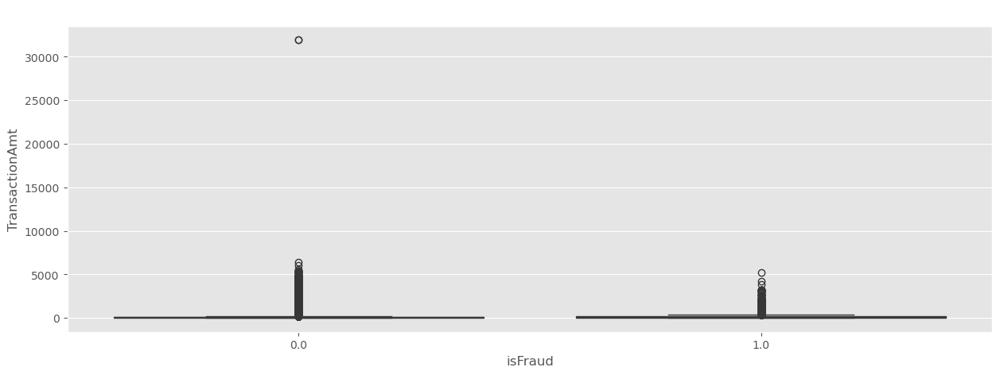

Outlier Ratio: 11.26%
Normal Ratio: 88.74%

Outlier 'isFraud' Class Distribution:
isFraud
0.0    0.949279
1.0    0.050721
Name: count, dtype: float64

Normal 'isFraud' Class Distribution:
isFraud
0.0    0.967006
1.0    0.032994
Name: count, dtype: float64


In [197]:
plot_and_analyze_iqr(train, 'TransactionAmt')

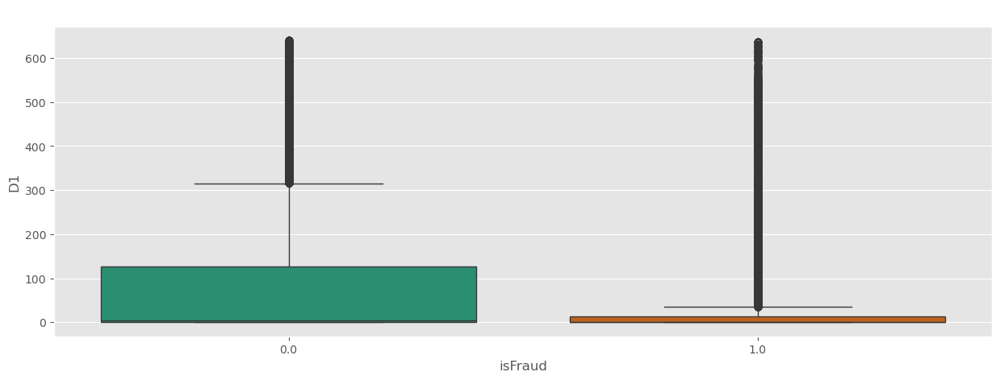

Outlier Ratio: 12.56%
Normal Ratio: 87.44%

Outlier 'isFraud' Class Distribution:
isFraud
0.0    0.988704
1.0    0.011296
Name: count, dtype: float64

Normal 'isFraud' Class Distribution:
isFraud
0.0    0.961601
1.0    0.038399
Name: count, dtype: float64


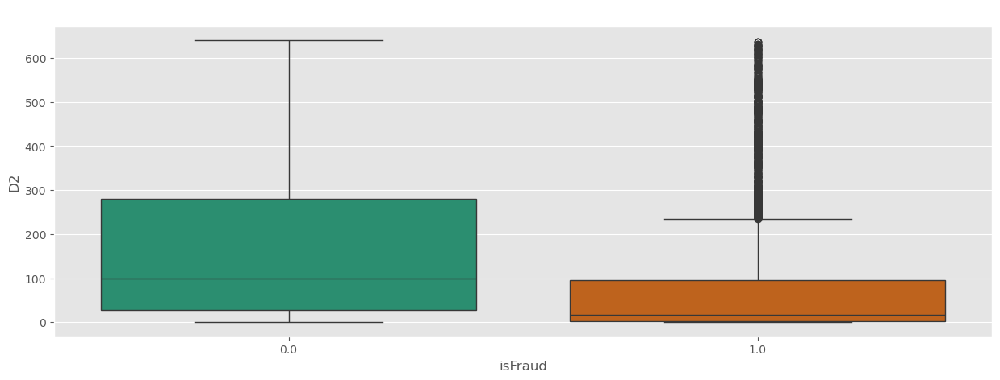

Outlier Ratio: 0.00%
Normal Ratio: 100.00%

Outlier 'isFraud' Class Distribution:
Series([], Name: count, dtype: float64)

Normal 'isFraud' Class Distribution:
isFraud
0.0    0.974592
1.0    0.025408
Name: count, dtype: float64


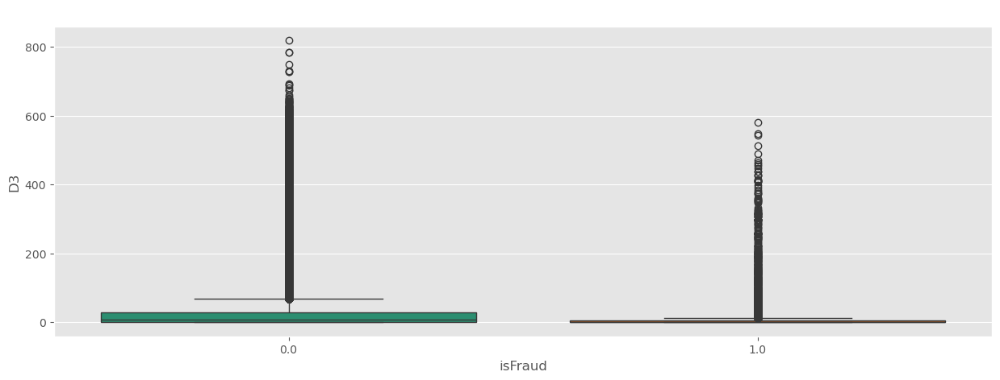

Outlier Ratio: 5.47%
Normal Ratio: 94.53%

Outlier 'isFraud' Class Distribution:
isFraud
0.0    0.987581
1.0    0.012419
Name: count, dtype: float64

Normal 'isFraud' Class Distribution:
isFraud
0.0    0.968792
1.0    0.031208
Name: count, dtype: float64


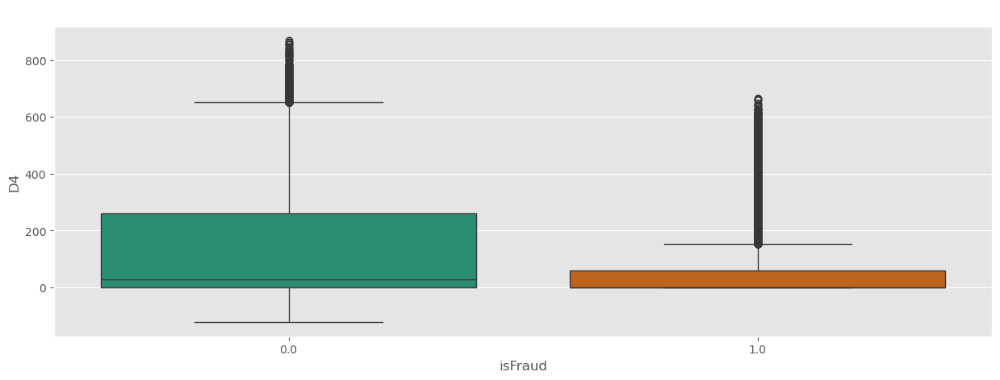

Outlier Ratio: 0.50%
Normal Ratio: 99.50%

Outlier 'isFraud' Class Distribution:
isFraud
0.0    0.996301
1.0    0.003699
Name: count, dtype: float64

Normal 'isFraud' Class Distribution:
isFraud
0.0    0.965231
1.0    0.034769
Name: count, dtype: float64


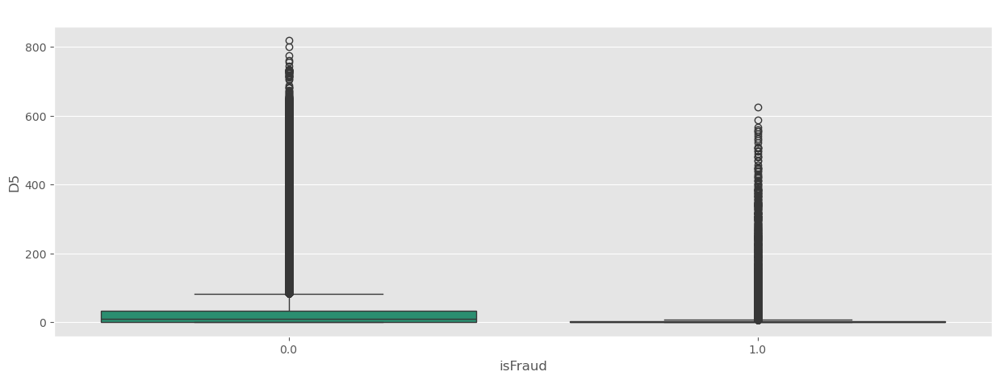

Outlier Ratio: 6.39%
Normal Ratio: 93.61%

Outlier 'isFraud' Class Distribution:
isFraud
0.0    0.986675
1.0    0.013325
Name: count, dtype: float64

Normal 'isFraud' Class Distribution:
isFraud
0.0    0.957287
1.0    0.042713
Name: count, dtype: float64


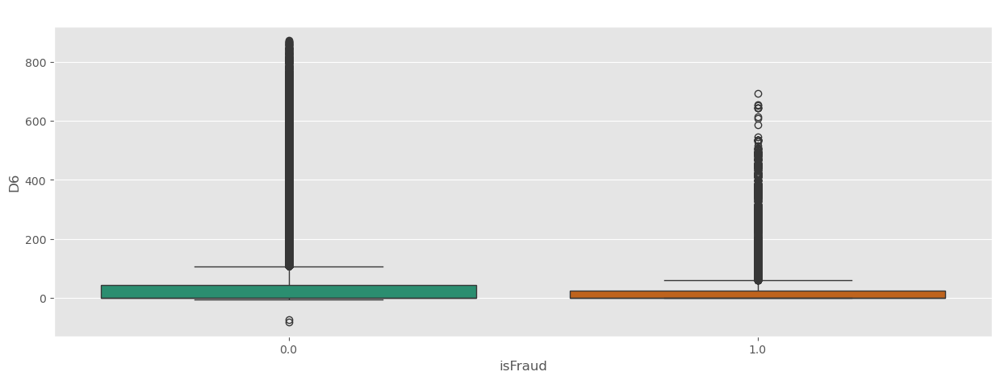

Outlier Ratio: 2.51%
Normal Ratio: 97.49%

Outlier 'isFraud' Class Distribution:
isFraud
0.0    0.917319
1.0    0.082681
Name: count, dtype: float64

Normal 'isFraud' Class Distribution:
isFraud
0.0    0.888758
1.0    0.111242
Name: count, dtype: float64


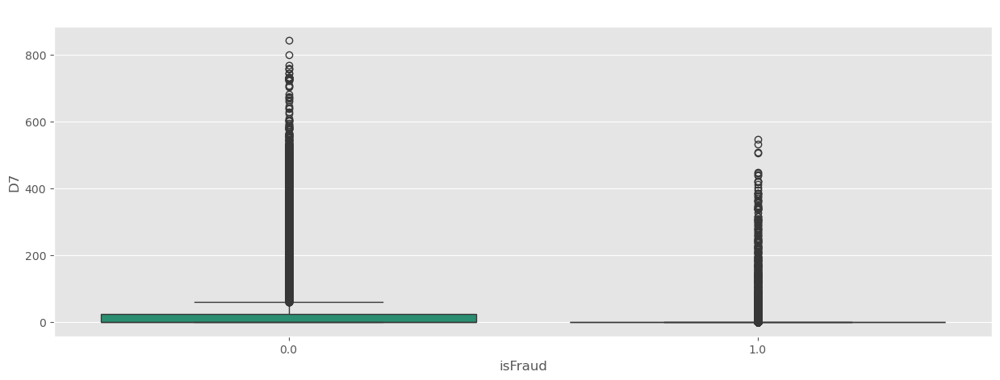

Outlier Ratio: 1.22%
Normal Ratio: 98.78%

Outlier 'isFraud' Class Distribution:
isFraud
0.0    0.950676
1.0    0.049324
Name: count, dtype: float64

Normal 'isFraud' Class Distribution:
isFraud
0.0    0.828733
1.0    0.171267
Name: count, dtype: float64


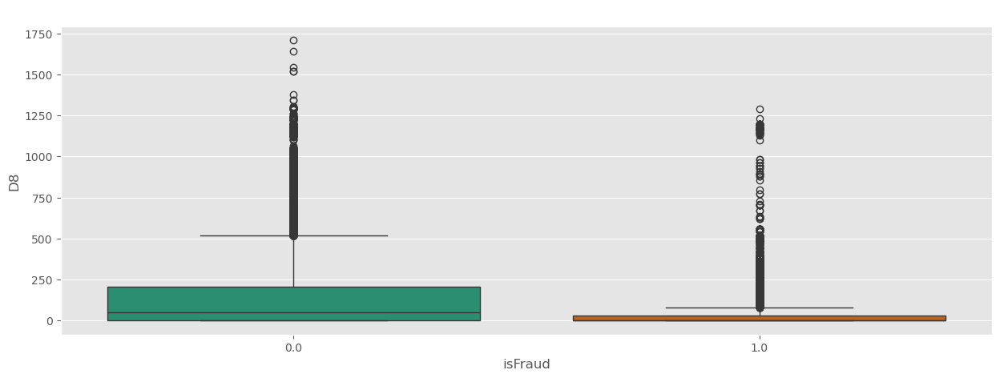

Outlier Ratio: 1.19%
Normal Ratio: 98.81%

Outlier 'isFraud' Class Distribution:
isFraud
0.0    0.978826
1.0    0.021174
Name: count, dtype: float64

Normal 'isFraud' Class Distribution:
isFraud
0.0    0.886904
1.0    0.113096
Name: count, dtype: float64


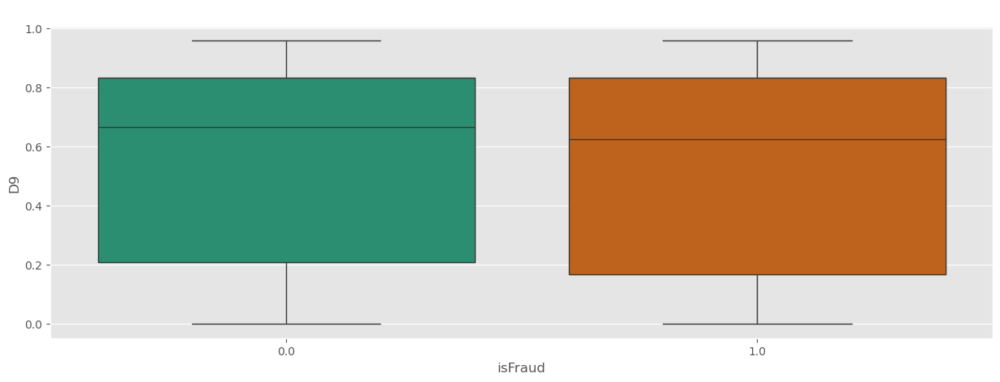

Outlier Ratio: 0.00%
Normal Ratio: 100.00%

Outlier 'isFraud' Class Distribution:
Series([], Name: count, dtype: float64)

Normal 'isFraud' Class Distribution:
isFraud
0.0    0.895537
1.0    0.104463
Name: count, dtype: float64


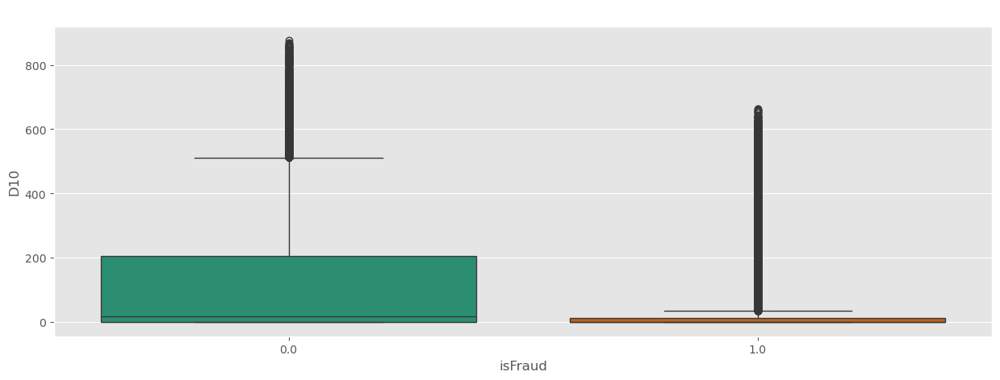

Outlier Ratio: 6.80%
Normal Ratio: 93.20%

Outlier 'isFraud' Class Distribution:
isFraud
0.0    0.988692
1.0    0.011308
Name: count, dtype: float64

Normal 'isFraud' Class Distribution:
isFraud
0.0    0.96559
1.0    0.03441
Name: count, dtype: float64


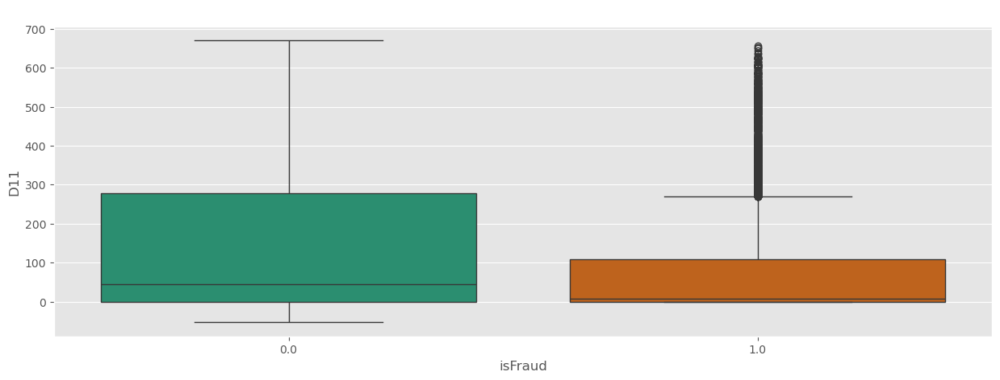

Outlier Ratio: 0.00%
Normal Ratio: 100.00%

Outlier 'isFraud' Class Distribution:
Series([], Name: count, dtype: float64)

Normal 'isFraud' Class Distribution:
isFraud
0.0    0.980383
1.0    0.019617
Name: count, dtype: float64


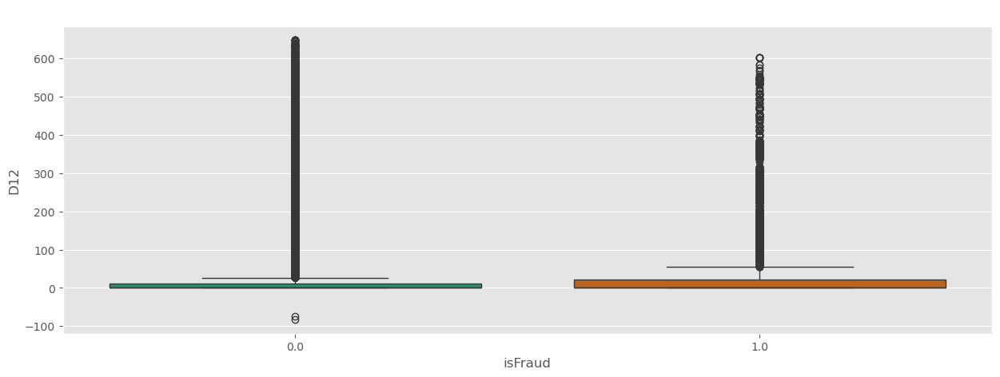

Outlier Ratio: 2.33%
Normal Ratio: 97.67%

Outlier 'isFraud' Class Distribution:
isFraud
0.0    0.876718
1.0    0.123282
Name: count, dtype: float64

Normal 'isFraud' Class Distribution:
isFraud
0.0    0.884182
1.0    0.115818
Name: count, dtype: float64


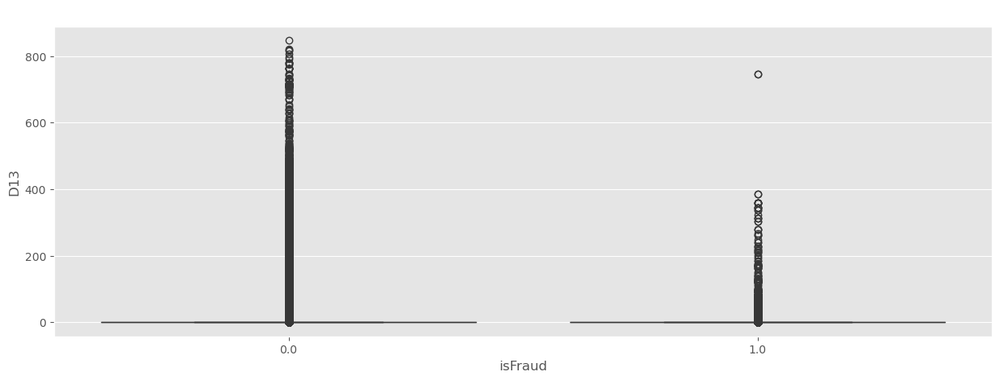

Outlier Ratio: 2.22%
Normal Ratio: 97.78%

Outlier 'isFraud' Class Distribution:
isFraud
0.0    0.892541
1.0    0.107459
Name: count, dtype: float64

Normal 'isFraud' Class Distribution:
isFraud
0.0    0.888862
1.0    0.111138
Name: count, dtype: float64


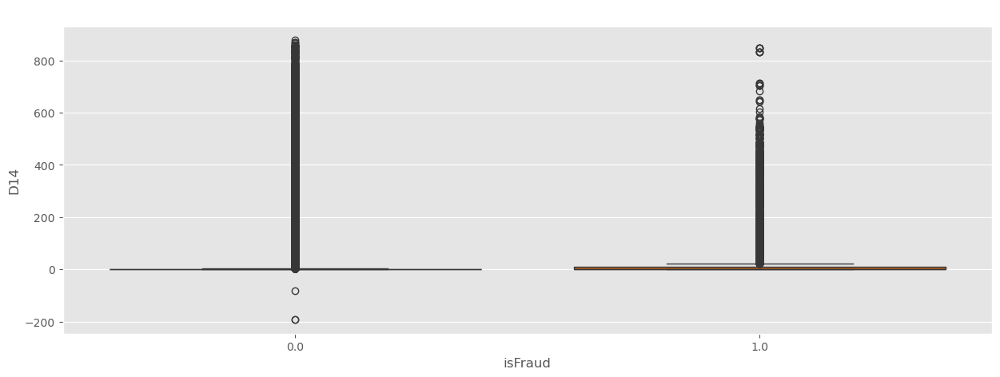

Outlier Ratio: 2.46%
Normal Ratio: 97.54%

Outlier 'isFraud' Class Distribution:
isFraud
0.0    0.863861
1.0    0.136139
Name: count, dtype: float64

Normal 'isFraud' Class Distribution:
isFraud
0.0    0.890162
1.0    0.109838
Name: count, dtype: float64


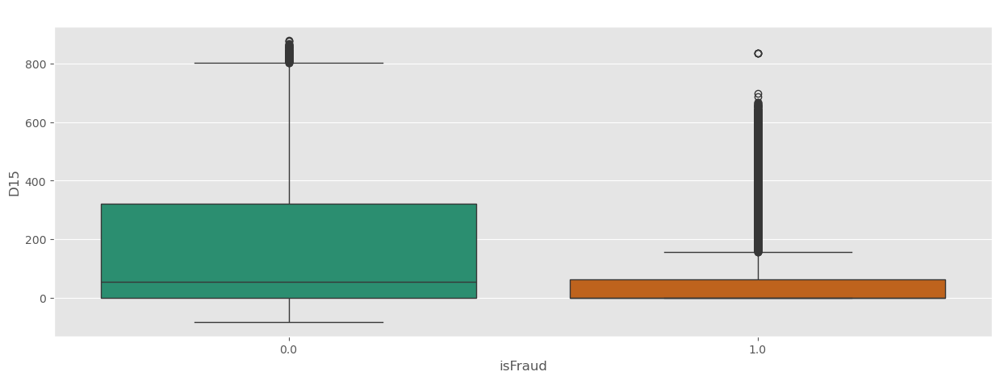

Outlier Ratio: 0.02%
Normal Ratio: 99.98%

Outlier 'isFraud' Class Distribution:
isFraud
0.0    0.969697
1.0    0.030303
Name: count, dtype: float64

Normal 'isFraud' Class Distribution:
isFraud
0.0    0.967319
1.0    0.032681
Name: count, dtype: float64


In [199]:
for c in dcols:
    plot_and_analyze_iqr(train, c)

In [38]:
cols = list(df.columns)

In [ ]:
a = pd.read_csv('./feature_importance/all_feature_importance.csv')
b = pd.read_csv('./feature_importance/baseline_feature_importance.csv')

In [71]:
e = pd.read_csv('./feature_importance/except_feature_importance.csv')

In [ ]:
d = pd.read_csv('./feature_importance/sampling_feature_importance2.csv')

In [ ]:
a = list(a['feature'])
b = list(b['feature'])

In [73]:
e = list(e['feature'])

In [77]:
e

['card1_D1_productCD_Amt_std',
 'account_make_date_D15',
 'uid2_hour_mean',
 'card1_D1_productCD_Amt_mean',
 'hist_uid2_transactionamt_std',
 'new_uid2_transactionamt_std',
 'hist_uid2_transactionamt_mean',
 'uid2_dayofweek_mean',
 'account_make_date_D1_count_full',
 'account_make_date_D10',
 'TransactionAmt',
 'same_Product_po',
 'uid2_TransactionAmt_std',
 'TransactionAmt_ProductCD',
 'd1_d2_count_full',
 'card1',
 'card2',
 'TransactionPerHour',
 'D1_productCD_hour_Amt_mean',
 'card1_make_d1_count_sum_ratio',
 'card1_make_d1_count_ratio',
 'uid2_next_click',
 'uid2_TransactionAmt_mean',
 'TransactionAmt_ProductCD_count_full',
 'ProductCD_D1_Amt_byDate',
 'card1_addr1_combine_fq_enc_combine',
 'new_card1_make_d1_sum',
 'card2_TransactionAmt_mean',
 'card1_addr2',
 'uid_TransactionAmt_mean',
 'd1_d2',
 'hist_card1_make_d1_sum',
 'card2_count_full',
 'card2_TransactionAmt_std',
 'uid2_TransactionAmt_nunique',
 'same_Product_po_cnt',
 'D4',
 'addr1_id_19_combine_fq_enc_combine',
 'uid_T

In [ ]:
d = list(d['feature'])

In [50]:
lst = []
for c in a:
    if c in cols:
        lst.append(c)

print(lst)

['TransactionAmt', 'card2', 'card1', 'D4', 'addr1', 'id_02', 'C13']


In [52]:
lst = []
for c in b:
    if c in cols:
        lst.append(c)
lst

['card1',
 'TransactionAmt',
 'card2',
 'addr1',
 'D4',
 'D10',
 'dist1',
 'id_02',
 'C13',
 'D11',
 'id_20',
 'P_emaildomain']

In [59]:
lst = []
for c in d:
    if c in cols:
        lst.append(c)
lst

['card2', 'TransactionAmt', 'card1', 'D4', 'D10', 'C13', 'addr1', 'id_02']

In [79]:
lst = []
for c in e:
    if c in cols:
        lst.append(c)
lst

['TransactionAmt', 'card1', 'card2', 'D4', 'id_02', 'C13']